### Genre Classification:

#### Objective: Classify tracks by genre.

In [1]:
! pip install pandas numpy matplotlib seaborn scikit-learn


[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [3]:
dataset=pd.read_csv("C:\\Users\\Dell\\OneDrive - Havells\\Desktop\\Classify-Spotify-Track-Genre\\Experiments\\dataset.csv")
dataset.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [4]:
df=pd.DataFrame(dataset)
df.sample()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
23602,23602,2Me8g0TZBRiOOYvjexvYwe,Alex Adair,Real for Me,Real for Me,56,180210,False,0.783,0.679,...,-7.041,0,0.0539,0.032,0.000486,0.141,0.553,120.031,4,deep-house


In [5]:
pd.set_option("display.max_columns",None)

In [6]:
df.sample()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
105441,105441,6UbEwbpoVMUDNG94ART8qm,Azurenity,Necklace,Necklace - Coffe Ambience,36,154180,False,0.418,0.152,0,-14.617,1,0.107,0.866,0.949,0.0962,0.152,147.867,4,study


In [7]:
df.shape

(114000, 21)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [9]:
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [10]:
df.duplicated().sum()

np.int64(0)

In [11]:
df.dropna(inplace=True)

In [12]:
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [13]:
df.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [14]:
object_columns=df.select_dtypes("object").columns
object_columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'track_genre'], dtype='object')

In [15]:
col_int=df.select_dtypes("int64").columns
col_int

Index(['Unnamed: 0', 'popularity', 'duration_ms', 'key', 'mode',
       'time_signature'],
      dtype='object')

In [16]:
col_float=df.select_dtypes("float64").columns
col_float

Index(['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')

In [17]:
df.describe(exclude="object")

,Unnamed: 0,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,113999.000000,113999.000000,1.139990e+05,113999,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
unique,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,104252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,56999.421925,33.238827,2.280312e+05,NaN,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034
std,32909.243463,22.304959,1.072961e+05,NaN,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623
min,0.000000,0.000000,8.586000e+03,NaN,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28499.500000,17.000000,1.740660e+05,NaN,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000
50%,56999.000000,35.000000,2.129060e+05,NaN,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,85499.500000,50.000000,2.615060e+05,NaN,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000


In [18]:
for i,feature in enumerate(object_columns):
    print(i+1,feature,"->",df[feature].nunique())

1 track_id -> 89740
2 artists -> 31437
3 album_name -> 46589
4 track_name -> 73608
5 track_genre -> 114


In [19]:
df.drop("Unnamed: 0",axis=1,inplace=True)

In [20]:
df=df.reset_index(drop=True)
df.sample()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
28797,6BSAjvwFFgbC6aH8EUjfYm,Dillinger,"Resurrection, Vol. 1",Crabs in My Pants,27,177453,False,0.556,0.807,6,-7.482,0,0.0466,0.00385,0.0033,0.223,0.881,94.499,4,dub


#### Univariate Analysis

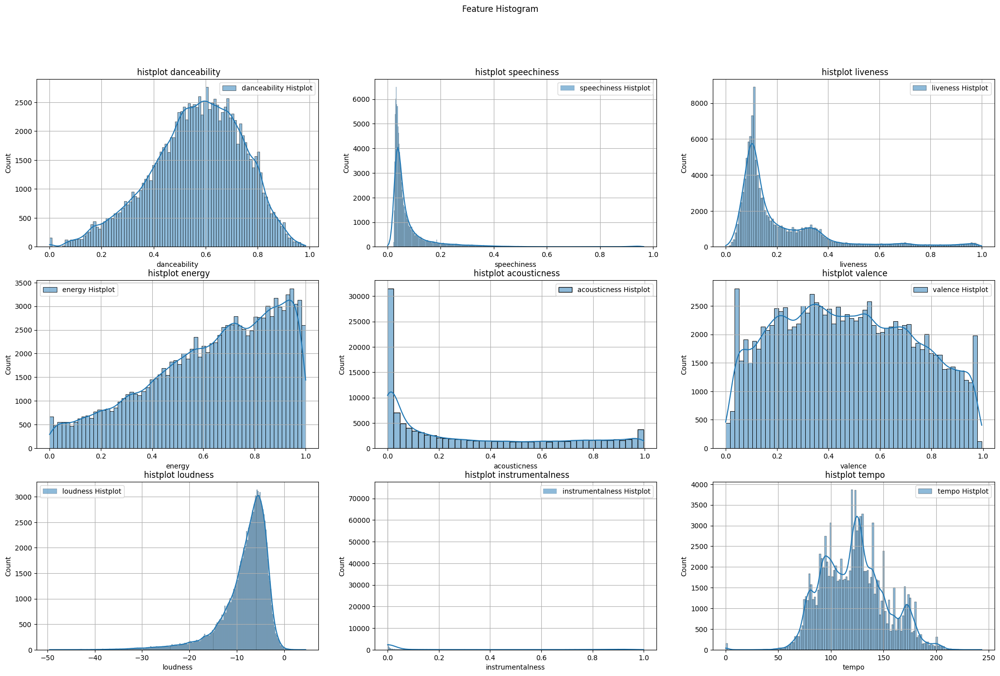

In [21]:
fig,ax=plt.subplots(3,3,figsize=(25,15))
for i ,feature in enumerate(col_float):
    row=i%3
    col=i//3
    sns.histplot(df[feature],kde=True,alpha=0.5,label="{} Histplot".format(feature),ax=ax[row,col])
    ax[row,col].set_title(" histplot {}".format(feature))
    ax[row,col].grid(True)
    ax[row,col].legend()
    
plt.suptitle("Feature Histogram")
plt.show()

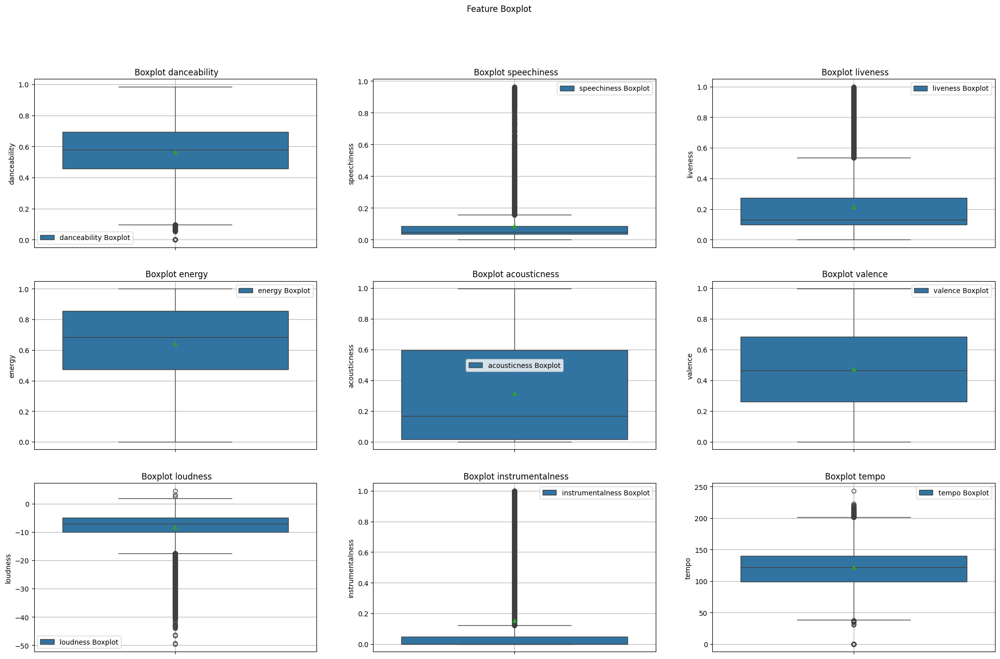

In [22]:
fig,ax=plt.subplots(3,3,figsize=(25,15))
for i ,feature in enumerate(col_float):
    row=i%3
    col=i//3
    sns.boxplot(df[feature],showmeans=True,label="{} Boxplot".format(feature),ax=ax[row,col])
    ax[row,col].set_title(" Boxplot {}".format(feature))
    ax[row,col].grid(True)
    ax[row,col].legend()
    
plt.suptitle("Feature Boxplot")
plt.show()

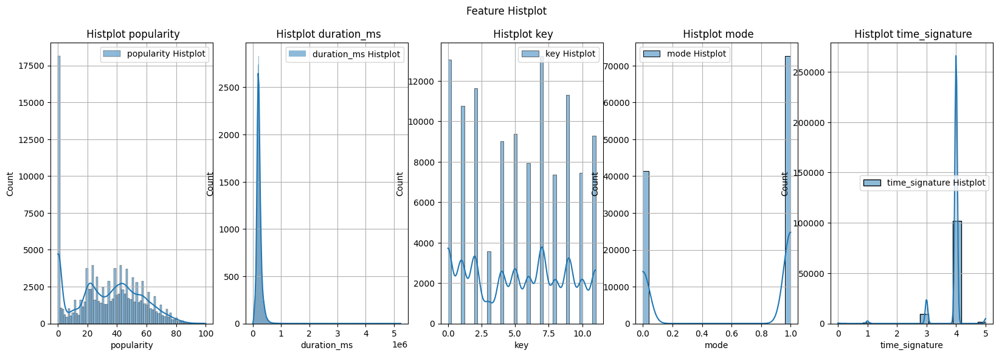

In [23]:
col_int=['popularity', 'duration_ms', 'key', 'mode',
       'time_signature']
fig,ax=plt.subplots(1,5,figsize=(20,6))
for i ,feature in enumerate(col_int):
    col=i%5
    sns.histplot(df[feature],kde=True,alpha=0.5,label="{} Histplot".format(feature),ax=ax[col])
    ax[col].set_title(" Histplot {}".format(feature))
    ax[col].grid(True)
    ax[col].legend()
    
plt.suptitle("Feature Histplot")
plt.show()

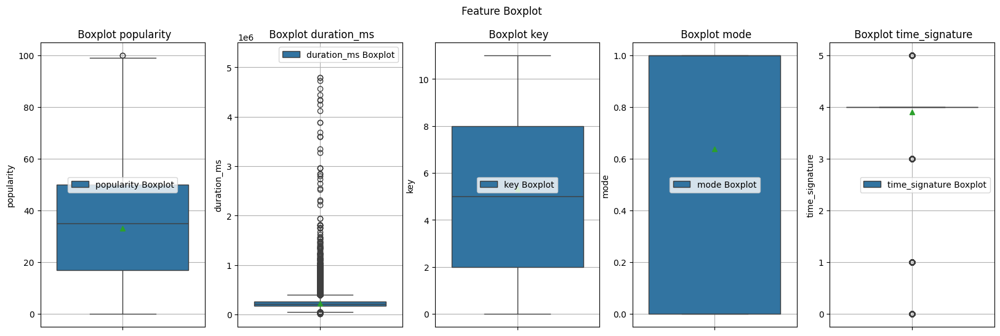

In [24]:
col_int=['popularity', 'duration_ms', 'key', 'mode',
       'time_signature']
fig,ax=plt.subplots(1,5,figsize=(20,6))
for i ,feature in enumerate(col_int):
    col=i%5
    sns.boxplot(df[feature],showmeans=True,label="{} Boxplot".format(feature),ax=ax[col])
    ax[col].set_title(" Boxplot {}".format(feature))
    ax[col].grid(True)
    ax[col].legend()
    
plt.suptitle("Feature Boxplot")
plt.show()


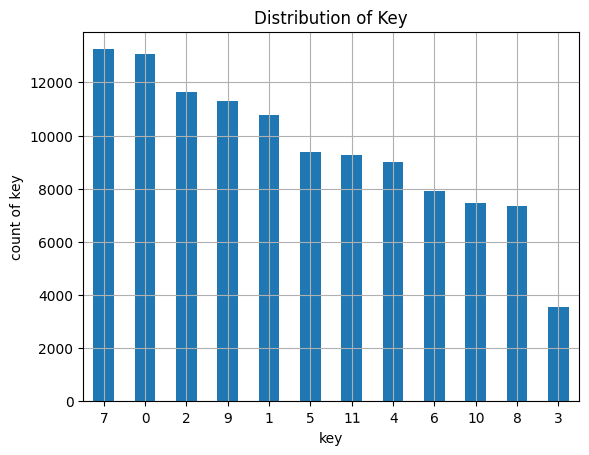

In [25]:
df["key"].value_counts().plot(kind="bar")
plt.xticks(rotation=True)
plt.xlabel("key")
plt.ylabel("count of key")
plt.title("Distribution of Key")
plt.grid(True)
plt.show()

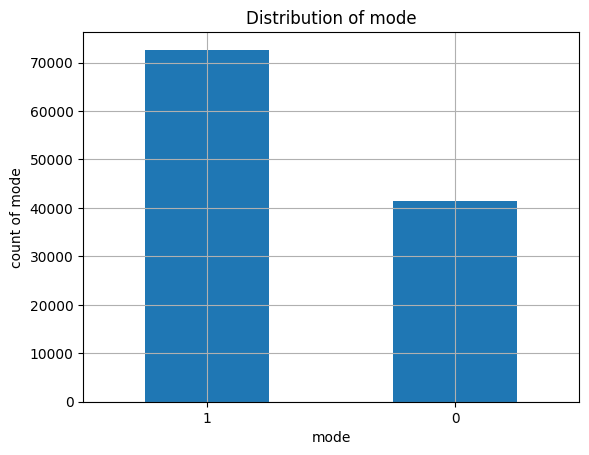

In [26]:
df["mode"].value_counts().plot(kind="bar")
plt.xticks(rotation=True)
plt.xlabel("mode")
plt.ylabel("count of mode")
plt.title("Distribution of mode")
plt.grid(True)
plt.show()

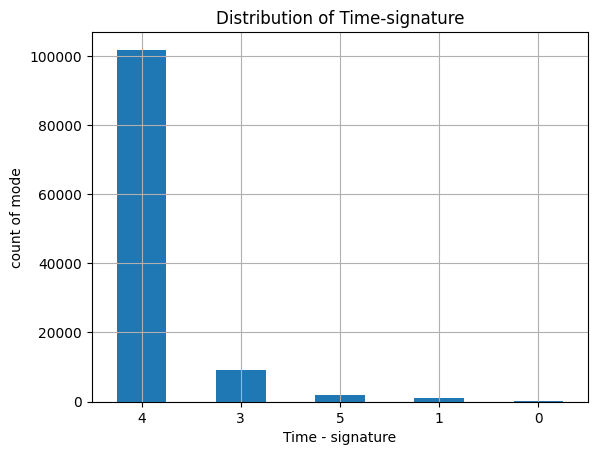

In [27]:
df["time_signature"].value_counts().plot(kind="bar")
plt.xticks(rotation=True)
plt.xlabel("Time - signature")
plt.ylabel("count of mode")
plt.title("Distribution of Time-signature")
plt.grid(True)
plt.show()

In [28]:
object_columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'track_genre'], dtype='object')

In [29]:
artist=df["artists"].value_counts().sort_values(ascending=False).reset_index().head(10)
artist

,artists,count
0,The Beatles,279
1,George Jones,271
2,Stevie Wonder,236
3,Linkin Park,224
4,Ella Fitzgerald,222
5,Prateek Kuhad,217
6,Feid,202
7,Chuck Berry,190
8,Håkan Hellström,183
9,OneRepublic,181


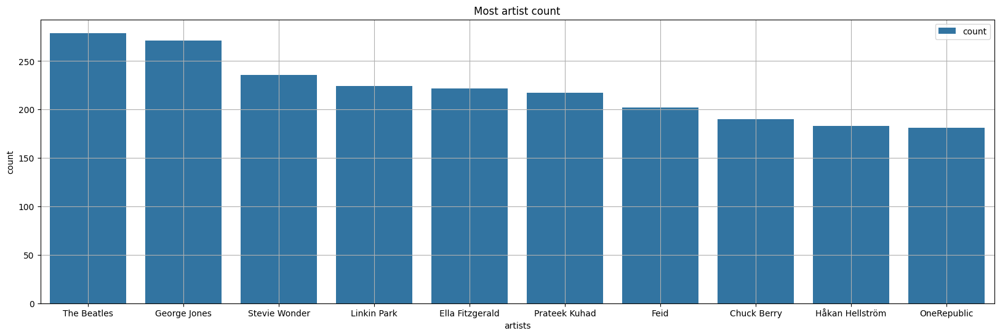

In [30]:
plt.figure(figsize=(20,6))
sns.barplot(x=artist["artists"],y=artist["count"],label="count")
plt.title("Most artist count")
plt.grid()
plt.legend()
plt.show()

In [31]:
album_name=df["album_name"].value_counts().sort_values(ascending=False).reset_index().head(10)
album_name

,album_name,count
0,Alternative Christmas 2022,195
1,Feliz Cumpleaños con Perreo,184
2,Metal,143
3,Halloween con perreito,123
4,Halloween Party 2022,115
5,The Complete Hank Williams,111
6,Fiesta portatil,110
7,Frescura y Perreo,106
8,Esto me suena a Farra,105
9,Perreo en Halloween,103


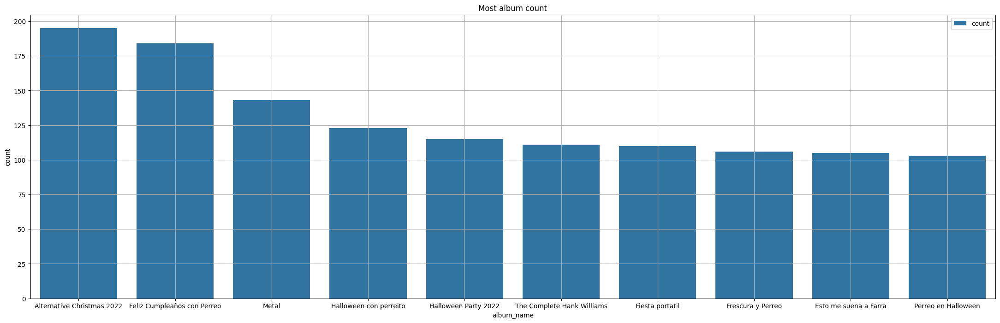

In [32]:
plt.figure(figsize=(27,8))
sns.barplot(x=album_name["album_name"],y=album_name["count"],label="count")
plt.title("Most album count")
plt.grid()
plt.legend()
plt.show()

In [33]:
track_name=df["track_name"].value_counts().sort_values(ascending=False).reset_index().head(10)
track_name

,track_name,count
0,Run Rudolph Run,151
1,Halloween,88
2,Frosty The Snowman,81
3,Little Saint Nick - 1991 Remix,76
4,Last Last,75
5,Christmas Time,72
6,CÓMO SE SIENTE - Remix,64
7,Sleigh Ride,61
8,RUMBATÓN,60
9,X ÚLTIMA VEZ,58


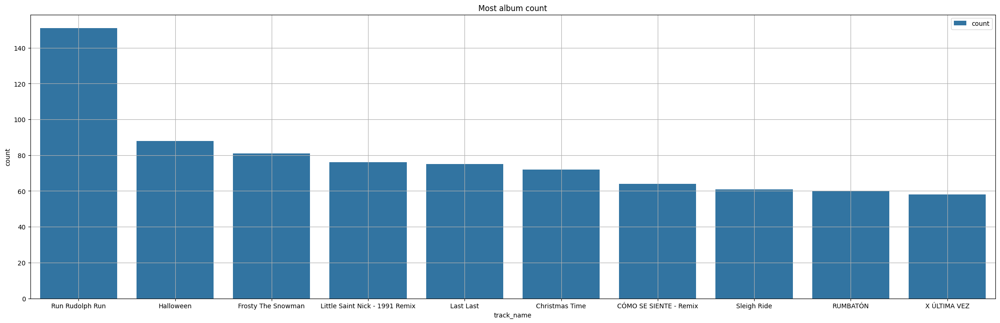

In [34]:
plt.figure(figsize=(27,8))
sns.barplot(x=track_name["track_name"],y=track_name["count"],label="count")
plt.title("Most album count")
plt.grid()
plt.legend()
plt.show()

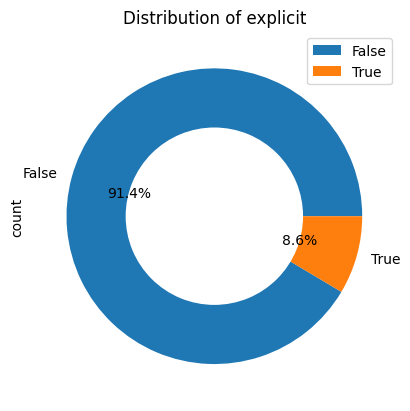

In [35]:
df["explicit"].value_counts().plot(kind="pie",autopct="%1.1f%%")
plt.pie([1],colors="white",radius=0.6)
plt.title("Distribution of explicit")
plt.legend(loc=1)
plt.show()

### Bivariate Analysis

#### Relation between Popularity and track genre

In [36]:
popularity=df.groupby("track_genre")["popularity"].mean().sort_values(ascending=False).reset_index().head(10)
popularity

,track_genre,popularity
0,pop-film,59.283000
1,k-pop,56.952953
2,chill,53.651000
3,sad,52.379000
4,grunge,49.594000
5,indian,49.539000
6,anime,48.772000
7,emo,48.128000
8,sertanejo,47.866000
9,pop,47.576000


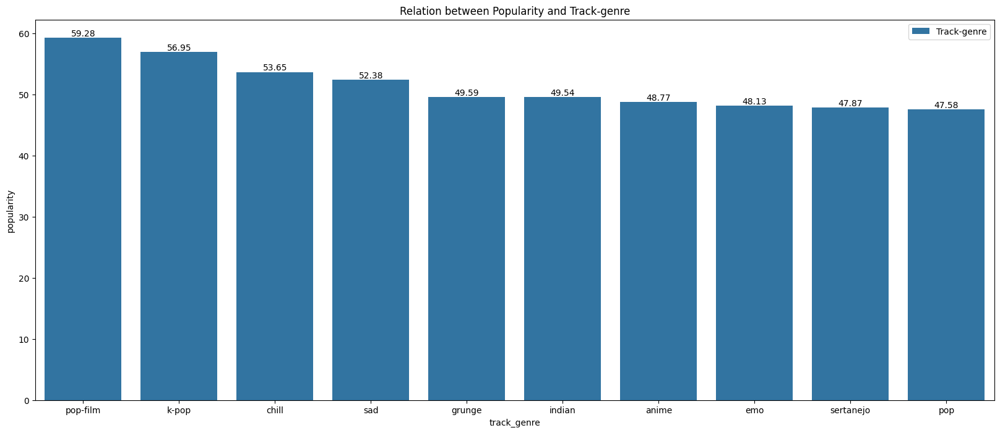

In [37]:
plt.figure(figsize=(20,8))
bars=sns.barplot(x=popularity["track_genre"],y=popularity["popularity"],label="Track-genre")
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Popularity and Track-genre")
plt.legend()
plt.show()


#### Relation between Track-genre to duration-ms

In [38]:
duration_ms=df.groupby("track_genre")["duration_ms"].mean().sort_values(ascending=False).reset_index().head(10)
duration_ms

,track_genre,duration_ms
0,detroit-techno,372012.402
1,minimal-techno,368863.246
2,chicago-house,366853.868
3,breakbeat,321762.218
4,iranian,319709.537
5,gospel,313218.041
6,techno,312311.477
7,black-metal,311103.115
8,new-age,299070.683
9,world-music,297195.622


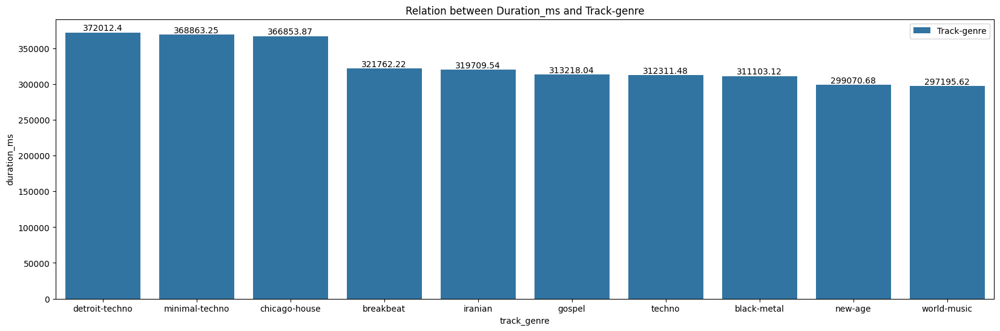

In [39]:
plt.figure(figsize=(20,6))
bars=sns.barplot(x=duration_ms['track_genre'],y=duration_ms['duration_ms'],label="Track-genre")
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Duration_ms and Track-genre")
plt.legend()
plt.show()

#### Danceability with track-genre

In [40]:
danceability=df.groupby("track_genre")["danceability"].mean().sort_values(ascending=False).reset_index().head(10)
danceability

,track_genre,danceability
0,kids,0.778906
1,chicago-house,0.766176
2,reggaeton,0.758521
3,latino,0.757057
4,reggae,0.745331
5,hip-hop,0.736154
6,dancehall,0.734169
7,minimal-techno,0.729395
8,detroit-techno,0.722568
9,latin,0.721902


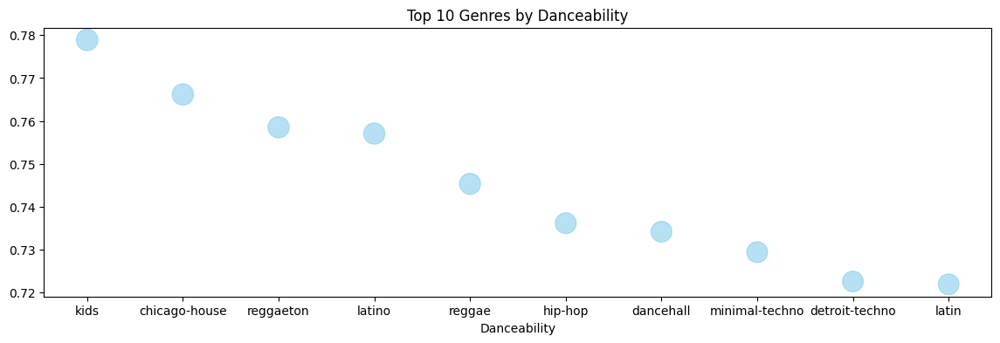

In [41]:
plt.figure(figsize=(14,4))
plt.scatter(danceability["track_genre"],danceability["danceability"],s=danceability["danceability"]*400,  
    alpha=0.6,
    color='skyblue'
)
plt.title("Top 10 Genres by Danceability")
plt.xlabel("Danceability")
plt.show()


#### Energy

In [42]:
energy=df.groupby("track_genre")["energy"].mean().sort_values(ascending=False).reset_index().head(10)
energy

,track_genre,energy
0,death-metal,0.931470
1,grindcore,0.924201
2,metalcore,0.914485
3,happy,0.910971
4,hardstyle,0.901246
5,drum-and-bass,0.876635
6,black-metal,0.874897
7,heavy-metal,0.874003
8,party,0.871237
9,j-idol,0.868677


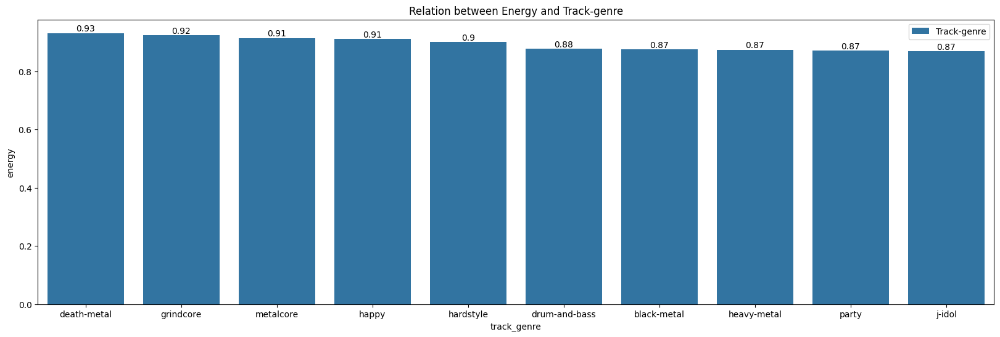

In [43]:
plt.figure(figsize=(20,6))
bars=sns.barplot(x=energy['track_genre'],y=energy['energy'],label="Track-genre")
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Energy and Track-genre")
plt.legend()
plt.show()

### Loudness

In [44]:
loudness=df.groupby("track_genre")["loudness"].mean().sort_values(ascending=False).reset_index().head(10)
loudness

,track_genre,loudness
0,j-idol,-3.771215
1,drum-and-bass,-4.159624
2,hardstyle,-4.345983
3,party,-4.411871
4,metalcore,-4.457694
5,reggaeton,-4.987124
6,dubstep,-5.063413
7,forro,-5.122201
8,latino,-5.176923
9,latin,-5.263596


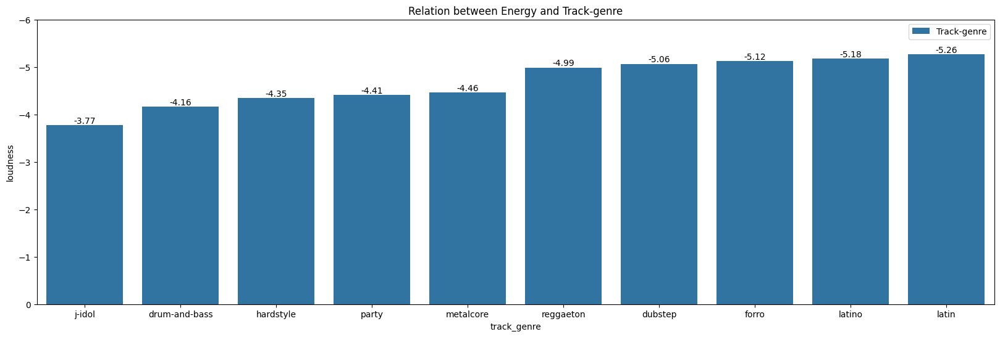

In [45]:
plt.figure(figsize=(20,6))
bars=sns.barplot(x=loudness["track_genre"],y=loudness["loudness"],label="Track-genre")
plt.ylim([0,-6])
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Energy and Track-genre")
plt.legend()
plt.show()

#### Speechiness

In [47]:
speechiness=df.groupby("track_genre")["speechiness"].mean().sort_values(ascending=False).reset_index().head(10)
speechiness

,track_genre,speechiness
0,comedy,0.755625
1,j-dance,0.220405
2,dancehall,0.186986
3,kids,0.152846
4,funk,0.151649
5,hardcore,0.149354
6,grindcore,0.137471
7,sad,0.130431
8,hip-hop,0.130353
9,french,0.126647


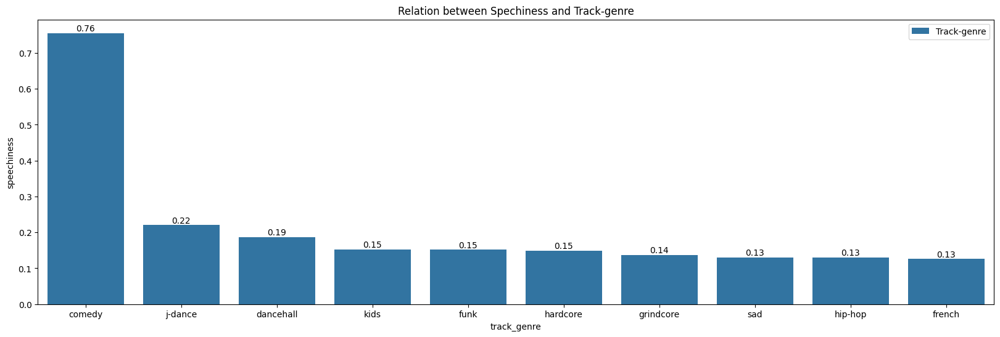

In [48]:
plt.figure(figsize=(20,6))
bars=sns.barplot(x=speechiness["track_genre"],y=speechiness["speechiness"],label="Track-genre")
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Spechiness and Track-genre")
plt.legend()
plt.show()

#### acousticness

In [49]:
Acousticness=df.groupby("track_genre")["acousticness"].mean().sort_values(ascending=False).reset_index().head(10)
Acousticness

,track_genre,acousticness
0,classical,0.920049
1,romance,0.869495
2,tango,0.846209
3,new-age,0.824022
4,opera,0.794931
5,ambient,0.776790
6,guitar,0.773053
7,disney,0.742892
8,comedy,0.726476
9,jazz,0.715816


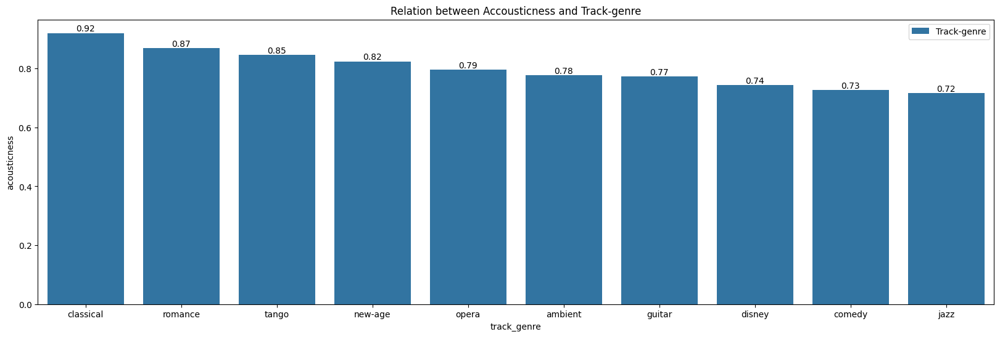

In [50]:
plt.figure(figsize=(20,6))
bars=sns.barplot(x=Acousticness["track_genre"],y=Acousticness["acousticness"],label="Track-genre")
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Accousticness and Track-genre")
plt.legend()
plt.show()

In [51]:
instrumentalness=df.groupby("track_genre")["instrumentalness"].mean().sort_values(ascending=False).reset_index().head(10)
instrumentalness

,track_genre,instrumentalness
0,study,0.789757
1,minimal-techno,0.744538
2,sleep,0.723539
3,new-age,0.713021
4,detroit-techno,0.699548
5,ambient,0.676221
6,idm,0.674931
7,classical,0.619208
8,iranian,0.589848
9,techno,0.540038


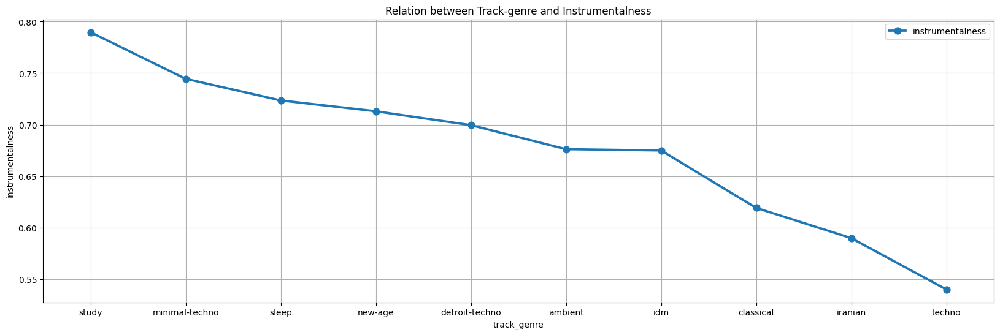

In [52]:
plt.figure(figsize=(20,6))
sns.pointplot(x=instrumentalness["track_genre"],y=instrumentalness["instrumentalness"],label="instrumentalness")
plt.grid(True)
plt.title("Relation between Track-genre and Instrumentalness")
plt.show()

#### Liveness

In [53]:
df.head(1)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.461,1,-6.746,0,0.143,0.0322,0.000001,0.358,0.715,87.917,4,acoustic


In [54]:
liveness=df.groupby("track_genre")["liveness"].mean().sort_values(ascending=False).reset_index().head(10)
liveness

,track_genre,liveness
0,comedy,0.661666
1,pagode,0.519864
2,sertanejo,0.474224
3,samba,0.443192
4,sleep,0.357736
5,mpb,0.339464
6,gospel,0.298669
7,brazil,0.297962
8,forro,0.294971
9,party,0.287739


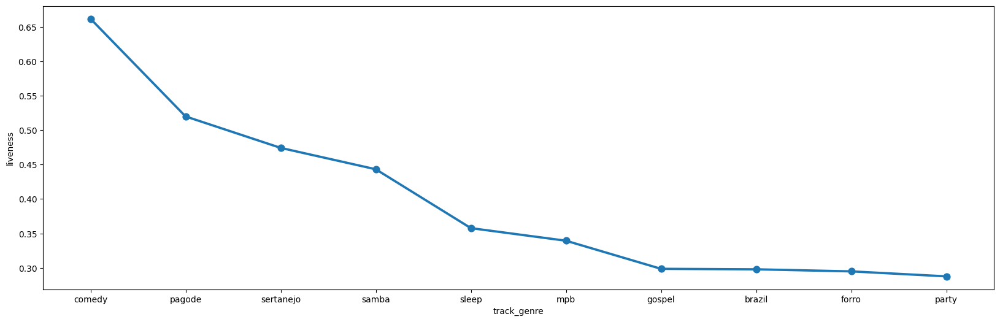

In [55]:
plt.figure(figsize=(20,6))
sns.pointplot(x=liveness["track_genre"],y=liveness["liveness"])
plt.show()

#### Valence 

In [56]:
valence=df.groupby("track_genre")["valence"].mean().sort_values(ascending=False).reset_index().head(10)
valence

,track_genre,valence
0,salsa,0.814838
1,forro,0.760693
2,rockabilly,0.726951
3,afrobeat,0.698619
4,ska,0.696720
5,children,0.694287
6,samba,0.693409
7,pagode,0.687978
8,party,0.681235
9,kids,0.680864


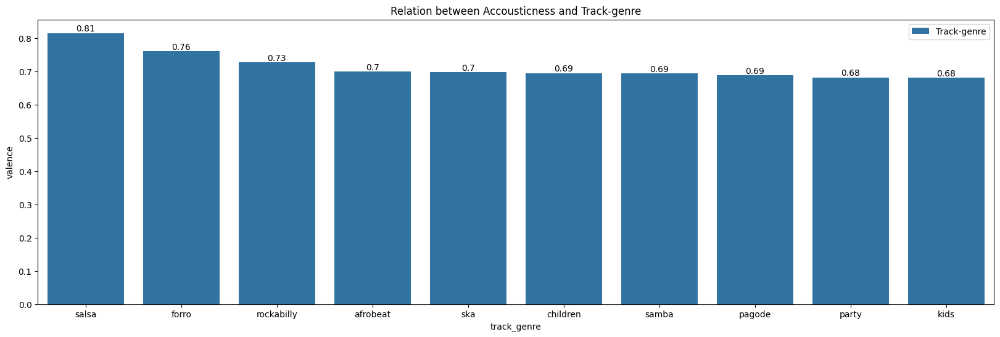

In [57]:
plt.figure(figsize=(20,6))
bars=sns.barplot(x=valence["track_genre"],y=valence["valence"],label="Track-genre")
for i in bars.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,2)}",ha="center",va="bottom")
plt.title("Relation between Accousticness and Track-genre")
plt.legend()
plt.show()

#### Tempo

In [58]:
tempo=df.groupby("track_genre")["tempo"].mean().sort_values(ascending=False).reset_index().head(10)
tempo

,track_genre,tempo
0,drum-and-bass,155.241712
1,happy,152.908962
2,hardstyle,146.837452
3,forro,140.362197
4,j-idol,136.112004
5,power-pop,134.651615
6,dubstep,133.631709
7,punk,133.600518
8,trance,133.276726
9,breakbeat,133.030213


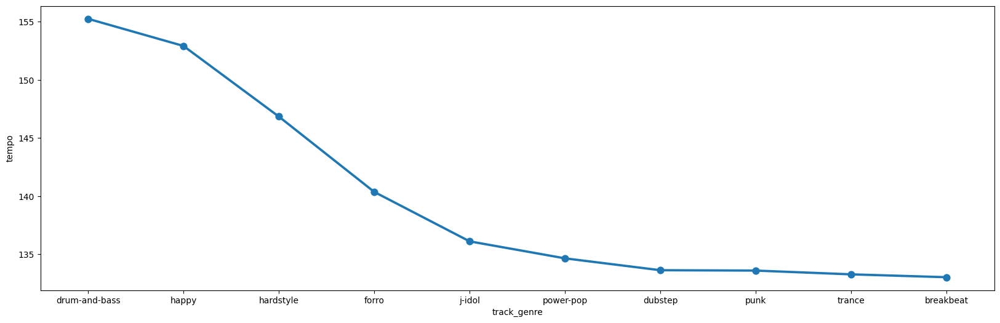

In [59]:
plt.figure(figsize=(20,6))
sns.pointplot(x=tempo["track_genre"],y=tempo["tempo"])
plt.show()

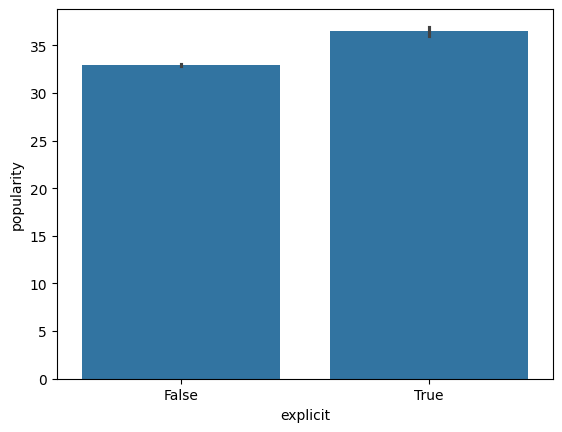

In [60]:
sns.barplot(x=df["explicit"],y=df["popularity"])
plt.show()

In [61]:
from scipy.stats import ttest_ind
ho="popularity has no effect with explicit"
h1="Popularity has effect on explicit"

explicit_0=df[df["explicit"]==True]["popularity"]
explicit_1=df[df["explicit"]==False]["popularity"]

t_stats,p_value=ttest_ind(explicit_0,explicit_1)
print(t_stats)
print(p_value)

if p_value>0.05:
    print("We failed to reject the null hypothesis")
else:
    print("We reject the null hypothesis")

14.896799406169768
3.85500797421256e-50
We reject the null hypothesis


#### Multivariate Analysis

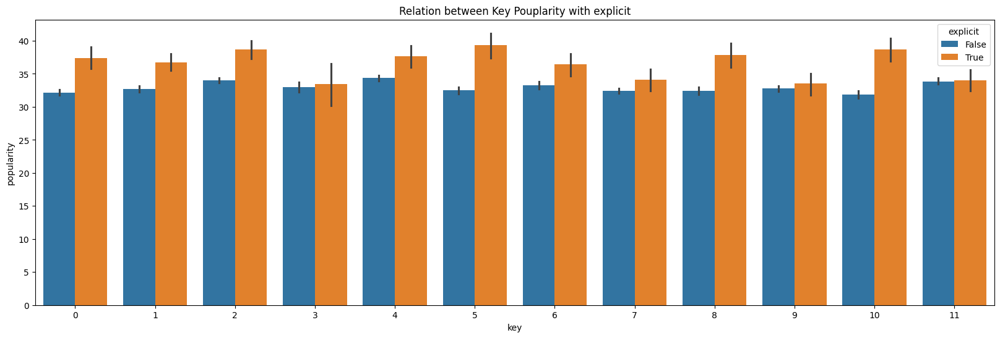

In [63]:
plt.figure(figsize=(20,6))
sns.barplot(x=df["key"],y=df["popularity"],hue=df["explicit"])
plt.title("Relation between Key Pouplarity with explicit")
plt.show()

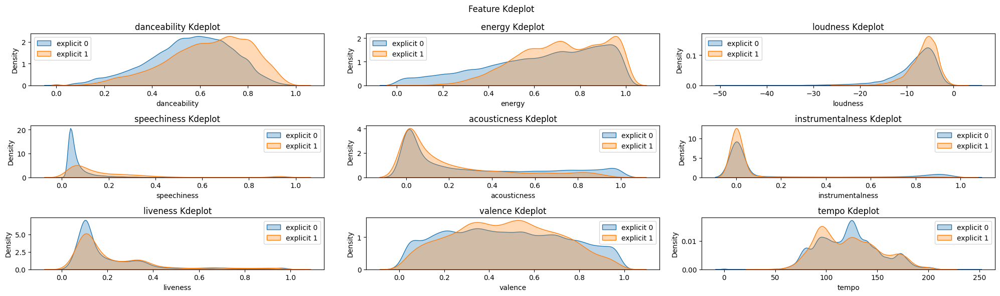

In [64]:
fig,ax=plt.subplots(3,3,figsize=(20,6))
col1=["danceability",	"energy",	"loudness","speechiness","acousticness","instrumentalness","liveness","valence","tempo"]
for index,feature in enumerate(col1):
    row=index//3
    col=index%3
    sns.kdeplot(df[df["explicit"]==0][feature],fill=True,alpha=0.3,ax=ax[row,col],label="explicit 0")
    sns.kdeplot(df[df["explicit"]==1][feature],alpha=0.3,fill=True,ax=ax[row,col],label="explicit 1")
    ax[row,col].set_title("{} Kdeplot".format(feature))
    ax[row,col].legend()
plt.suptitle("Feature Kdeplot")
plt.tight_layout()
plt.show()

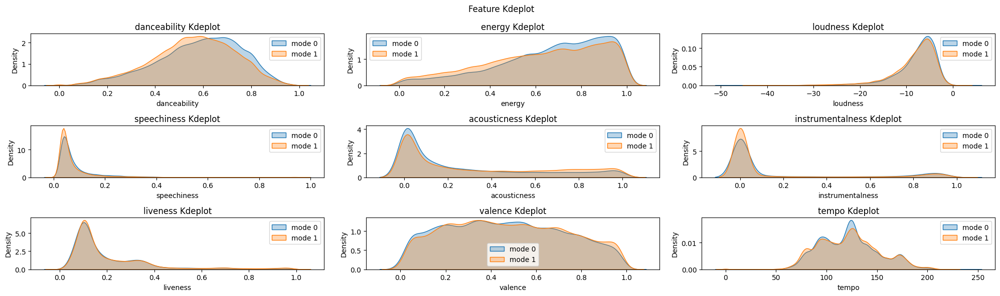

In [65]:
fig,ax=plt.subplots(3,3,figsize=(20,6))
col1=["danceability",	"energy",	"loudness","speechiness","acousticness","instrumentalness","liveness","valence","tempo"]
for index,feature in enumerate(col1):
    row=index//3
    col=index%3
    sns.kdeplot(df[df["mode"]==0][feature],fill=True,alpha=0.3,ax=ax[row,col],label="mode 0")
    sns.kdeplot(df[df["mode"]==1][feature],alpha=0.3,fill=True,ax=ax[row,col],label="mode 1")
    ax[row,col].set_title("{} Kdeplot".format(feature))
    ax[row,col].legend()
plt.suptitle("Feature Kdeplot")
plt.tight_layout()
plt.show()

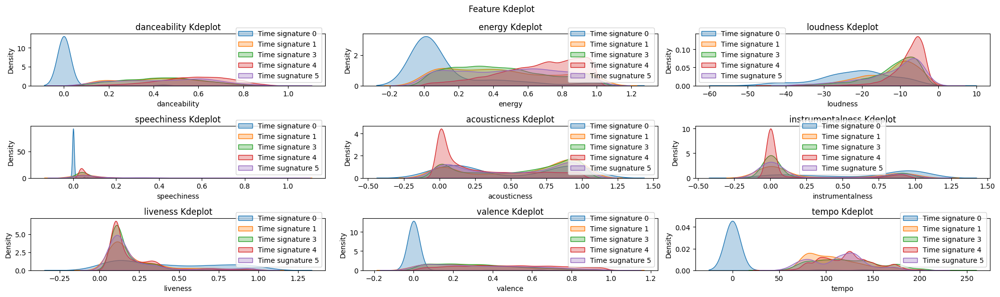

In [66]:
fig,ax=plt.subplots(3,3,figsize=(20,6))
col1=["danceability",	"energy",	"loudness","speechiness","acousticness","instrumentalness","liveness","valence","tempo"]
for index,feature in enumerate(col1):
    row=index//3
    col=index%3
    sns.kdeplot(df[df["time_signature"]==0][feature],fill=True,alpha=0.3,ax=ax[row,col],label="Time signature 0")
    sns.kdeplot(df[df["time_signature"]==1][feature],alpha=0.3,fill=True,ax=ax[row,col],label="Time signature 1")
    sns.kdeplot(df[df["time_signature"]==3][feature],alpha=0.3,fill=True,ax=ax[row,col],label="Time signature 3")
    sns.kdeplot(df[df["time_signature"]==4][feature],alpha=0.3,fill=True,ax=ax[row,col],label="Time signature 4")
    sns.kdeplot(df[df["time_signature"]==5][feature],alpha=0.3,fill=True,ax=ax[row,col],label="Time sugnature 5")
    ax[row,col].set_title("{} Kdeplot".format(feature))
    ax[row,col].legend()
plt.suptitle("Feature Kdeplot")
plt.tight_layout()
plt.show()

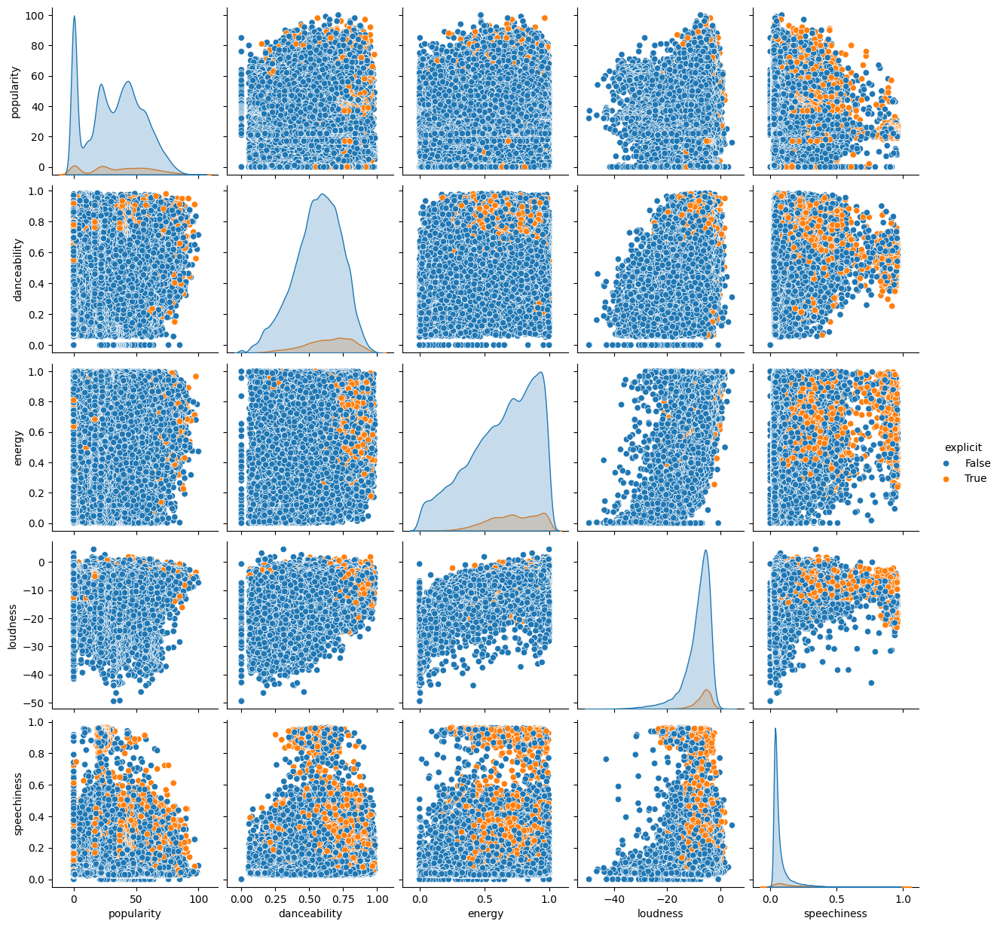

In [67]:
sns.pairplot(df,vars=["popularity","danceability","energy","loudness","speechiness"],hue="explicit",kind="scatter")
plt.show()

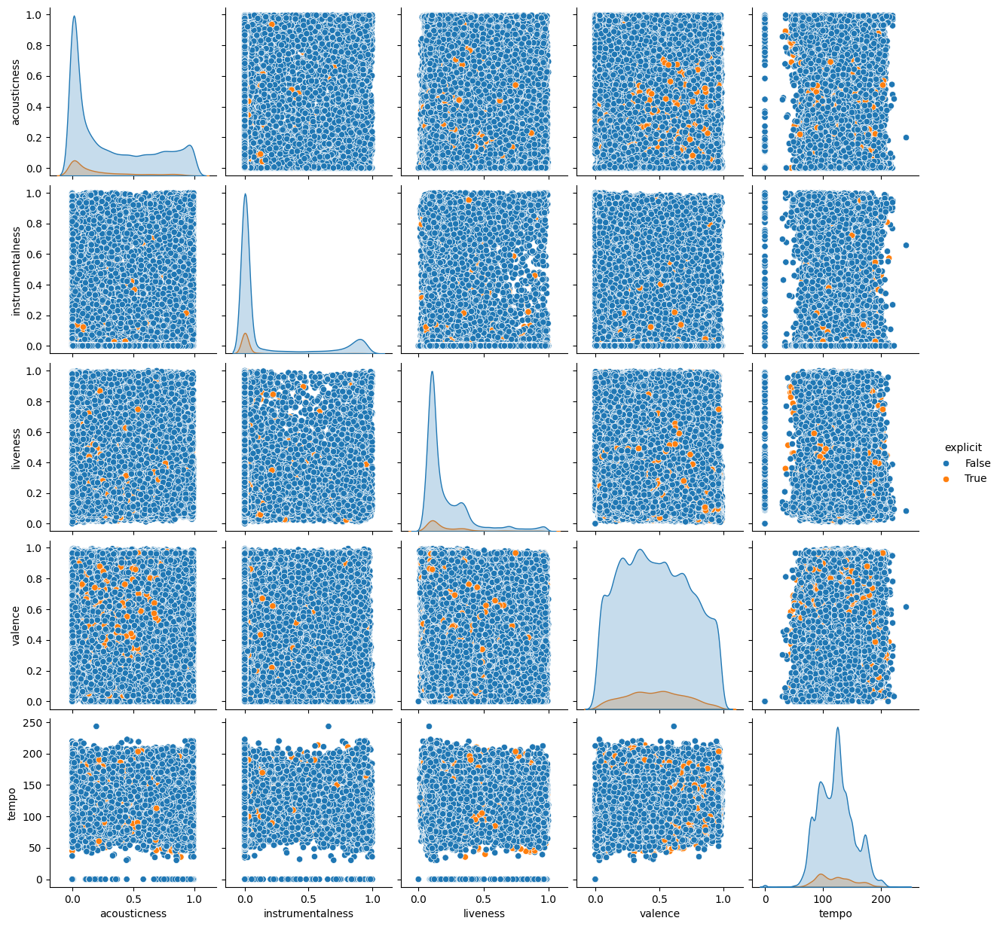

In [68]:
sns.pairplot(df,vars=["acousticness","instrumentalness","liveness","valence","tempo"],hue="explicit",kind="scatter")
plt.show()

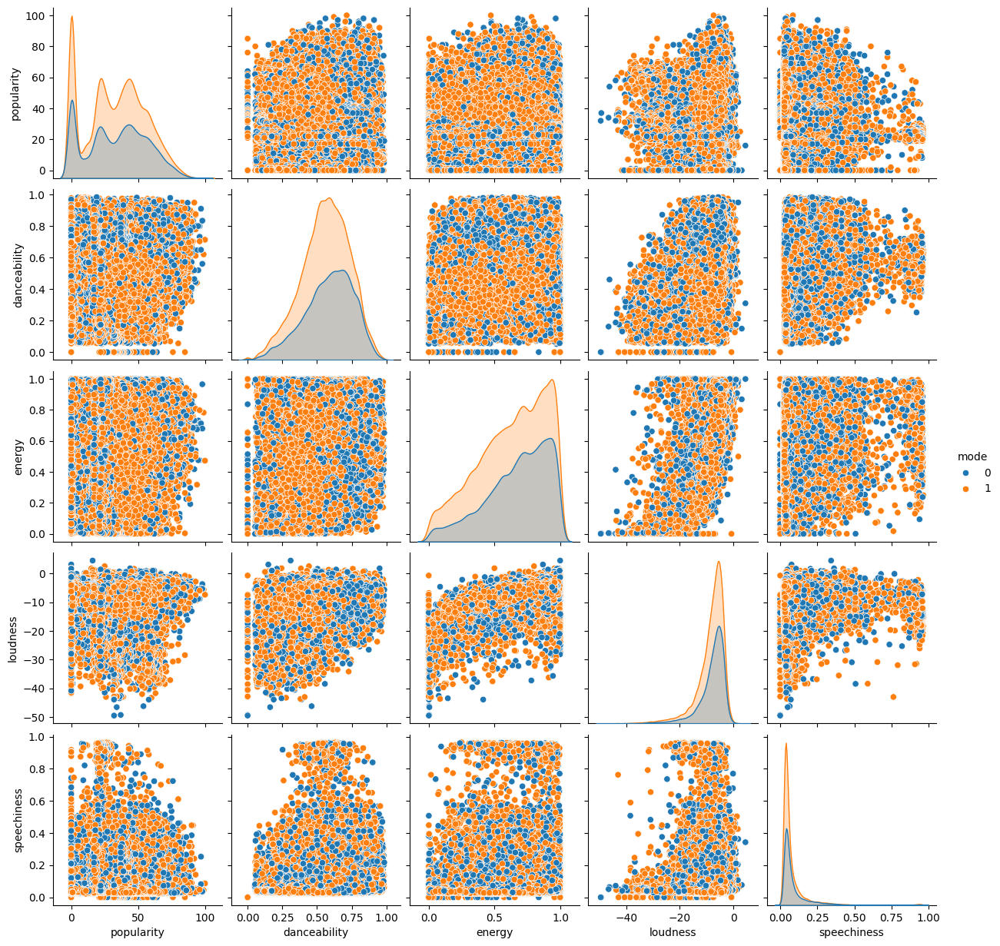

In [69]:
sns.pairplot(df,vars=["popularity","danceability","energy","loudness","speechiness"],hue="mode",kind="scatter")
plt.show()

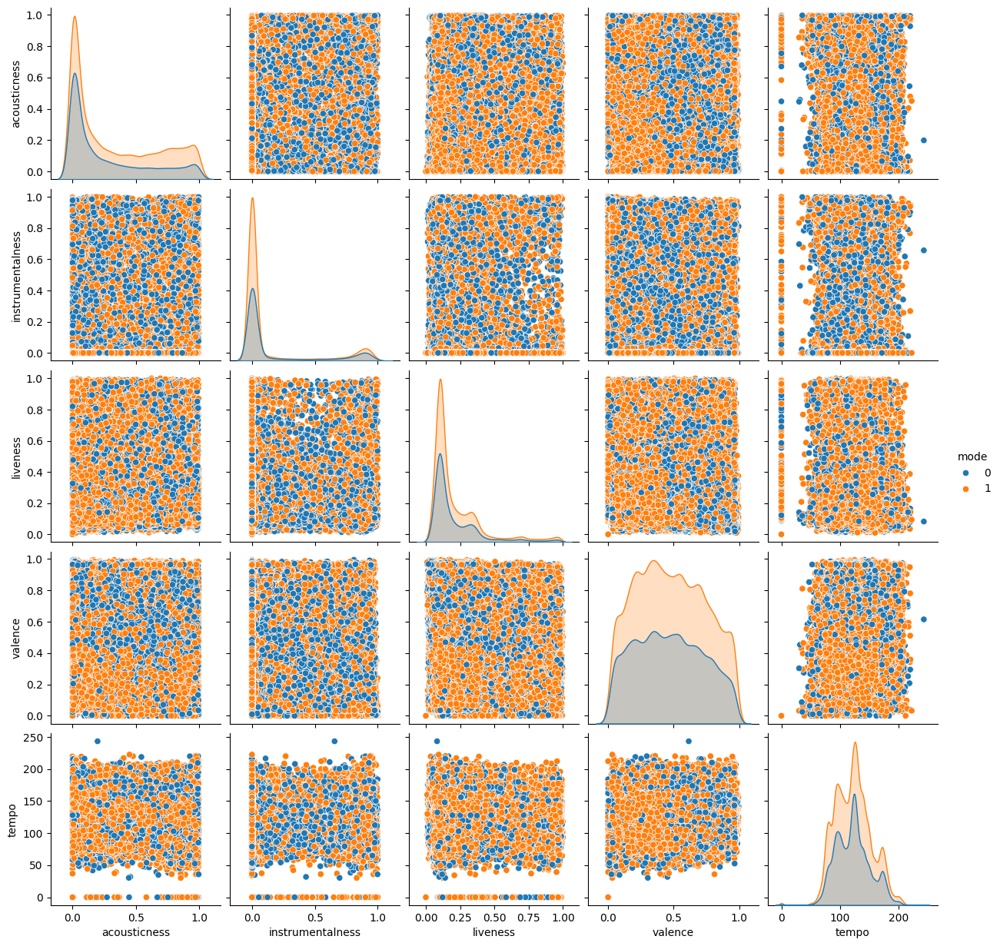

In [70]:
sns.pairplot(df,vars=["acousticness","instrumentalness","liveness","valence","tempo"],hue="mode",kind="scatter")
plt.show()

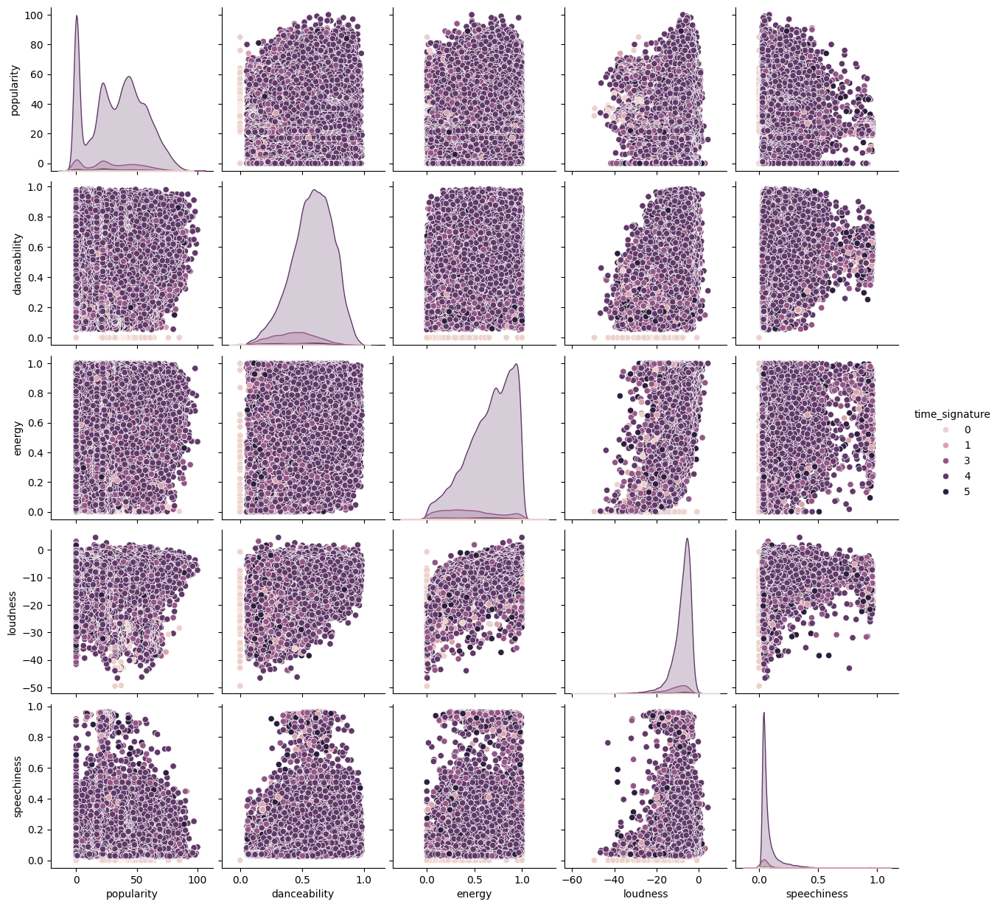

In [71]:
sns.pairplot(df,vars=["popularity","danceability","energy","loudness","speechiness"],hue="time_signature",kind="scatter")
plt.show()

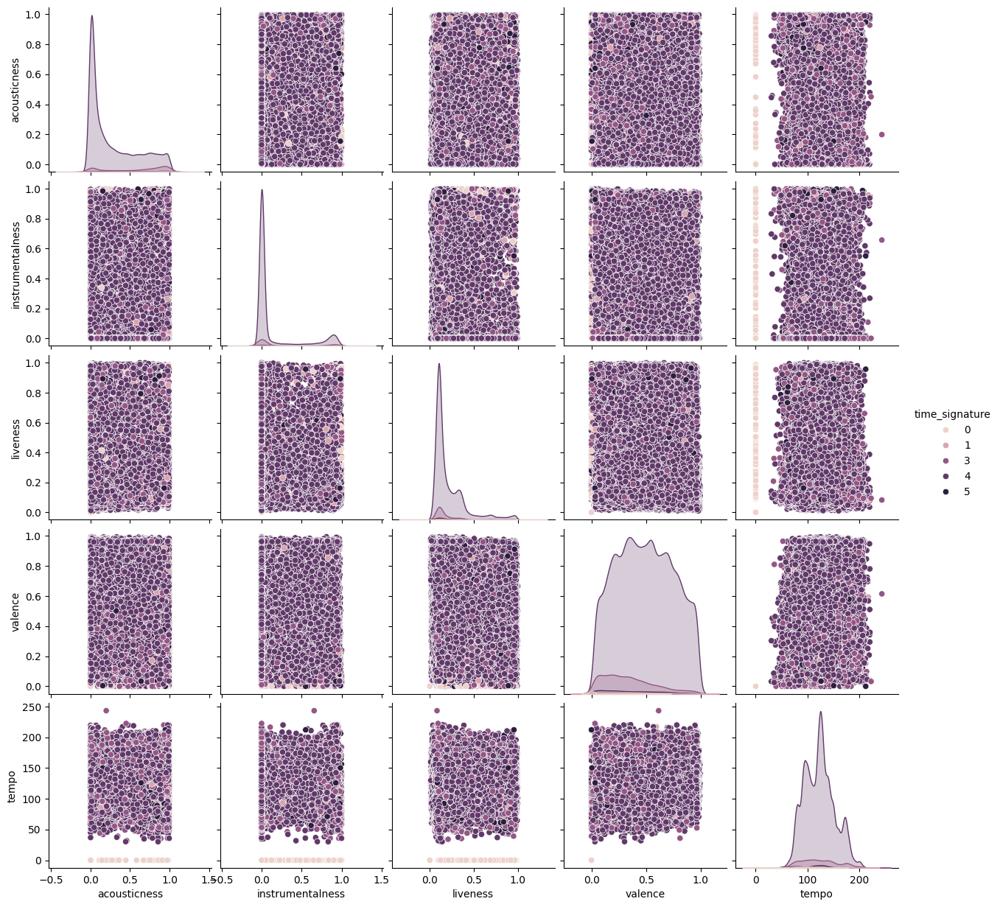

In [72]:
sns.pairplot(df,vars=["acousticness","instrumentalness","liveness","valence","tempo"],hue="time_signature",kind="scatter")
plt.show()

#### Conclusion of EDA->

### Feature Engineering

In [73]:
df.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [75]:
df.drop(["track_id","artists","album_name","track_name"],axis=1,inplace=True)

In [76]:
df["track_genre"]

0            acoustic
1            acoustic
2            acoustic
3            acoustic
4            acoustic
             ...     
113994    world-music
113995    world-music
113996    world-music
113997    world-music
113998    world-music
Name: track_genre, Length: 113999, dtype: object

In [77]:
! pip install gensim


[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [78]:
import gensim

In [79]:
import gensim.downloader as api

In [80]:
glove_model=api.load("glove-wiki-gigaword-300")

In [81]:
glove_model.most_similar("acoustic",topn=5)

[('guitar', 0.6608458757400513),
 ('guitars', 0.6346383690834045),
 ('instrumentation', 0.6038997173309326),
 ('vocals', 0.5810157656669617),
 ('percussion', 0.5294560194015503)]

In [82]:
unique_genre=df["track_genre"].unique()
unique_genre

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

In [83]:
df["track_genre"]=df["track_genre"].replace("black-metal","metal")
df["track_genre"]=df["track_genre"].replace('chicago-house',"house")
df["track_genre"]=df["track_genre"].replace('death-metal',"metal")
df["track_genre"]=df["track_genre"].replace('deep-house',"house")
df["track_genre"]=df["track_genre"].replace('detroit-techno',"techno")
df["track_genre"]=df["track_genre"].replace('drum-and-bass',"drum")
df["track_genre"]=df["track_genre"].replace('j-dance',"dance")
df["track_genre"]=df["track_genre"].replace('j-idol',"idol")
df["track_genre"]=df["track_genre"].replace('j-rock',"rock") #'minimal-techno'
df["track_genre"]=df["track_genre"].replace('minimal-techno',"techno")
df["track_genre"]=df["track_genre"].replace('pop-film',"pop")
df["track_genre"]=df["track_genre"].replace('progressive-house',"house") #psych-rock
df["track_genre"]=df["track_genre"].replace("psych-rock","rock")
df["track_genre"]=df["track_genre"].replace("r-n-b","rnb")
df["track_genre"]=df["track_genre"].replace("show-tunes","tunes")
df["track_genre"]=df["track_genre"].replace("world-music","music")

In [84]:
new_genre=df["track_genre"].unique()
print(new_genre)
print(len(new_genre))

['acoustic' 'afrobeat' 'alt-rock' 'alternative' 'ambient' 'anime' 'metal'
 'bluegrass' 'blues' 'brazil' 'breakbeat' 'british' 'cantopop' 'house'
 'children' 'chill' 'classical' 'club' 'comedy' 'country' 'dance'
 'dancehall' 'techno' 'disco' 'disney' 'drum' 'dub' 'dubstep' 'edm'
 'electro' 'electronic' 'emo' 'folk' 'forro' 'french' 'funk' 'garage'
 'german' 'gospel' 'goth' 'grindcore' 'groove' 'grunge' 'guitar' 'happy'
 'hard-rock' 'hardcore' 'hardstyle' 'heavy-metal' 'hip-hop' 'honky-tonk'
 'idm' 'indian' 'indie-pop' 'indie' 'industrial' 'iranian' 'idol' 'j-pop'
 'rock' 'jazz' 'k-pop' 'kids' 'latin' 'latino' 'malay' 'mandopop'
 'metalcore' 'mpb' 'new-age' 'opera' 'pagode' 'party' 'piano' 'pop'
 'power-pop' 'punk-rock' 'punk' 'rnb' 'reggae' 'reggaeton' 'rock-n-roll'
 'rockabilly' 'romance' 'sad' 'salsa' 'samba' 'sertanejo' 'tunes'
 'singer-songwriter' 'ska' 'sleep' 'songwriter' 'soul' 'spanish' 'study'
 'swedish' 'synth-pop' 'tango' 'trance' 'trip-hop' 'turkish' 'music']
103


In [85]:
vector=[glove_model[word] for word in new_genre]

In [86]:
vector_df=pd.DataFrame(dict(zip(new_genre,vector)))
vector_df=vector_df.T
vector_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
acoustic,0.053505,0.412540,-0.293170,0.27488,-0.11456,-0.518500,0.191490,0.029506,0.013395,-0.53094,0.622900,0.25728,0.194540,-0.167980,0.576380,0.052524,0.023325,-0.060629,0.196470,0.379470,0.288960,0.26676,-0.730780,0.640510,-0.410110,0.044799,0.093116,-0.088870,-0.130040,0.342090,-0.41407,0.475750,-0.270730,-0.323830,0.24097,0.494190,0.379350,-0.095859,0.547010,0.512810,-0.213230,0.172640,-0.196610,-0.227470,0.160870,1.065600,0.111460,-0.525190,0.174150,0.381670,0.376880,0.783340,-0.414450,0.337000,-0.225400,0.026792,-0.305040,-0.505310,0.032216,0.324300,0.148500,0.257990,0.539280,0.009153,0.134400,-0.099290,0.770120,-0.108730,0.557290,1.01300,-0.360840,-0.116470,0.022984,0.162580,-0.26938,0.156200,-0.269370,0.290420,0.041336,0.021114,-0.294770,0.37357,-0.030752,-0.785650,-0.470750,0.328040,0.289610,0.716800,-0.207470,-0.773600,0.535060,0.634260,0.078448,-0.386140,0.154910,-0.239040,-0.167240,-1.15490,0.332420,-0.711100,-0.257760,-0.060875,0.065594,-0.025330,-0.756780,0.327940,-0.16444,0.040082,-0.52698,-0.445170,0.938930,0.191380,0.190470,0.242100,-0.302460,-0.071449,0.268890,0.205310,-0.161780,-0.145620,-0.113570,0.021105,-0.170010,-0.317420,0.067900,-0.326850,-0.363570,-0.10172,-0.438960,0.629130,-0.454590,0.197780,0.864150,-0.731480,-0.578960,-0.294590,0.214310,0.493270,-0.535170,-0.049062,-0.021323,-0.137710,0.165150,-0.544270,-0.036519,-0.055967,-0.431020,0.078586,-0.175230,0.319780,-0.183060,-0.449960,-0.108850,0.045808,0.34944,0.13928,0.100550,0.528580,0.519650,-0.26009,0.13112,-0.61047,-0.546120,-0.29343,-0.27819,0.364390,-0.37421,0.132210,0.251510,0.081953,-0.064217,0.534590,0.85231,0.537230,0.066787,-0.217660,0.015571,0.697220,-0.497430,-0.308110,-0.476090,-0.503050,0.307380,0.465390,-0.573910,-0.389960,0.59940,0.157870,-0.568140,-0.106140,-0.34167,0.067441,0.196070,0.117470,-0.150720,-0.145400,-0.25588,0.252570,-0.226530,-0.263920,0.404530,0.57005,0.525680,0.014853,0.208290,0.577180,-0.346320,0.804440,-0.389980,-0.292030,0.933030,0.301900,0.870250,-0.026230,0.511160,0.549570,0.904910,-0.146350,-0.382330,0.728320,0.420760,0.080708,-0.611110,-0.286960,-0.308080,0.010264,0.129370,-0.646150,-0.501190,-0.017316,0.260170,-0.226480,-0.174200,-0.351930,0.580760,-0.096407,-0.49980,-0.265900,-0.306680,0.560830,0.392200,0.209670,-0.059350,0.144590,-0.23189,-0.228330,-0.612310,0.010739,-0.211690,0.577660,0.35716,-0.285480,0.019281,-0.021075,-0.345790,0.652450,0.714230,-0.066757,0.628060,-0.000427,0.31415,0.20523,0.302170,0.664580,-0.16703,0.094973,0.135970,0.141970,0.512200,-0.438010,0.256540,0.075016,-0.149170,-0.419050,-0.091548,-0.333530,-0.874840,0.351370,-0.32457,0.113190,-0.619930,0.352110,-0.719660,0.657370,0.137120,0.073825,-0.725930,-0.461480,0.033505,-0.50392,0.066091,0.056393,-0.445210,0.193840,0.132490,0.535290,0.493630,0.365800,-0.114390,0.064678
afrobeat,0.163380,-0.613720,-0.407050,0.80922,-0.35084,-0.366920,-0.272560,0.188450,-0.167530,1.

In [87]:
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
vector_df_norm=scalar.fit_transform(vector_df)

In [88]:
vector_df_norm=pd.DataFrame(vector_df_norm,columns=list(map(str,range(1,301))),index=new_genre)
vector_df_norm

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
acoustic,0.144142,1.501549,-0.512407,0.146713,-0.058370,-0.682972,0.615213,-0.145913,0.420004,-0.615622,2.281945,0.667468,0.406687,-1.342521,0.917821,0.729904,0.660039,-0.241203,-0.154306,0.519457,0.493258,-0.013407,-1.391338,0.884730,-1.006574,0.456809,-0.132275,-0.211803,-0.073573,0.240318,-0.226487,1.443880,-0.178744,-1.012276,0.361649,1.219368,1.015374,-0.196435,1.767310,0.666395,-0.706144,0.622966,-0.404268,-0.624341,-0.222037,1.804702,0.016572,-0.960814,0.535595,1.291037,1.153459,2.186087,-0.975949,0.400499,-0.129375,-0.004647,-0.394083,-1.248643,-0.663539,0.718076,0.130124,0.525144,0.908406,-0.227267,0.328121,-0.637065,1.678372,-0.703019,1.391926,1.600389,-1.340234,-0.427478,1.064240,0.476059,-0.554220,0.721879,-0.932133,0.974162,-0.023688,0.138631,-0.638053,1.038902,-0.563613,-1.438087,-1.766812,1.252891,0.535206,1.303052,-0.786203,-2.060158,0.814519,1.382744,-0.098130,-0.851714,0.463727,-0.235979,-0.982263,-2.350436,0.792380,-1.244335,-0.654694,-0.274611,-0.335297,0.410628,-1.976314,1.092037,0.235942,0.598635,-1.818865,-1.249824,2.077755,0.776470,0.662648,0.382172,-1.136536,0.247975,0.991120,0.870301,-0.151049,0.199594,-0.382213,-0.265472,-0.245619,-0.477570,-0.016488,-0.735542,-0.984818,-0.511332,-1.224073,1.357294,-1.334698,0.802194,1.597735,-1.150986,-1.721728,-0.607376,0.557157,0.541409,-1.468018,-0.650749,0.131593,0.009479,0.888252,-1.085107,-0.877766,-0.249596,-1.304495,0.151611,-0.293917,0.216623,-0.378346,-1.315082,-0.460789,-0.104452,0.502612,0.348316,0.452383,1.430576,1.276607,-0.194238,0.170386,-1.334923,-1.145139,-0.345016,-0.488514,0.746980,-1.060256,-0.265018,0.725633,0.825122,-0.604149,0.865246,1.784457,1.017589,-0.664104,-0.243256,0.251217,1.993289,-1.011384,-0.901025,-1.269803,-1.171620,1.027531,1.238944,-2.178286,-0.771715,0.893673,0.399335,-1.220786,-0.087913,-0.827217,0.583475,0.567520,0.263288,-0.490210,-0.597721,-0.207879,0.282966,-0.927465,-0.987893,-0.066846,1.348266,0.626838,0.009232,0.685145,1.460031,-0.850694,1.311597,-0.855117,-0.744864,3.324277,0.702132,2.178355,-1.154887,1.235626,0.906857,2.170461,0.104373,-1.367838,1.359905,0.941961,0.478524,-1.393800,-0.452209,-0.540295,0.054211,0.659934,-1.536535,-1.686163,-0.297709,0.523559,-1.050310,0.346277,-0.894685,1.021686,-0.426191,-1.016991,-0.816137,0.255220,1.499975,0.820580,0.996109,0.082588,0.336764,-0.190726,-1.078897,-1.306067,-0.192182,0.082281,0.803791,1.256623,-0.918904,0.110971,-0.647474,-0.541881,1.636910,1.437617,0.185835,1.512314,-0.207723,0.334209,0.649532,0.951094,1.854892,-0.097192,-0.256171,0.920502,0.265243,1.082034,-0.803970,0.551973,0.734236,-0.886706,-0.157139,-0.371395,-1.113096,-0.475671,1.296946,-0.432600,0.749058,-1.245414,1.136963,-0.871359,1.064407,0.436042,0.312233,-1.365658,-1.573984,0.081020,-1.035604,-0.292960,0.353472,-0.514302,0.340542,-0.000251,0.981969,1.360057,0.596686,0.105133,-0.007555
afrobeat,0.521934,-1.986744,-0.859087,1.523563,-0.

In [89]:
from sklearn.decomposition import PCA
pca=PCA()
new_vector=pca.fit_transform(vector_df_norm)

In [90]:
pca.explained_variance_ratio_

array([7.40227848e-02, 6.14142753e-02, 4.32660021e-02, 3.63775976e-02,
       3.47768739e-02, 3.12172193e-02, 2.88868900e-02, 2.41108853e-02,
       2.24984605e-02, 2.08143461e-02, 1.99573487e-02, 1.94044206e-02,
       1.82548221e-02, 1.80700682e-02, 1.77486818e-02, 1.64909959e-02,
       1.62599552e-02, 1.58339664e-02, 1.53862545e-02, 1.51531752e-02,
       1.46651296e-02, 1.41427480e-02, 1.34991370e-02, 1.33375507e-02,
       1.24464743e-02, 1.22628650e-02, 1.19925505e-02, 1.13749513e-02,
       1.12785148e-02, 1.09091001e-02, 1.07679348e-02, 1.04787210e-02,
       1.03569534e-02, 9.87627078e-03, 9.76188853e-03, 9.44296177e-03,
       9.31214821e-03, 8.85408185e-03, 8.80196877e-03, 8.56838096e-03,
       8.09962116e-03, 7.94624072e-03, 7.65776401e-03, 7.59160193e-03,
       7.28889322e-03, 7.23749679e-03, 6.96843211e-03, 6.65992917e-03,
       6.31456356e-03, 6.09701080e-03, 6.02554390e-03, 5.90854743e-03,
       5.81215275e-03, 5.54273743e-03, 5.42805437e-03, 5.33358986e-03,
      

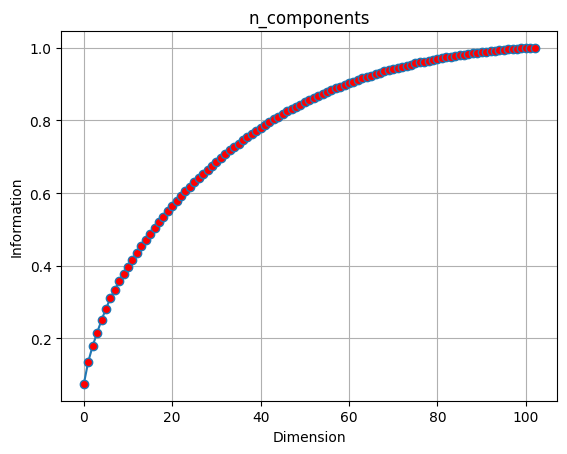

n_components value is 60


In [91]:
plt.plot(np.cumsum(pca.explained_variance_ratio_),marker="o",markerfacecolor="red")
plt.xlabel("Dimension")
plt.ylabel("Information")
plt.title("n_components")
plt.grid(True)
plt.show()
print("n_components value is 60")

In [92]:
pca1=PCA(n_components=2)
pca_df1=pca1.fit_transform(vector_df_norm)

In [93]:
pca_df=pd.DataFrame(pca_df1,columns=["PCA1","PCA2"],index=new_genre)
pca_df


,PCA1,PCA2
acoustic,4.248389,-6.104922
afrobeat,3.790117,2.527386
alt-rock,2.378515,6.926713
alternative,-1.769233,-0.332964
ambient,4.365935,-1.976140
...,...,...
tango,-0.843373,-3.230536
trance,2.794359,-1.080747
trip-hop,3.501006,6.596952
turkish,-11.147225,3.756806


In [94]:
! pip install yellowbrick


[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


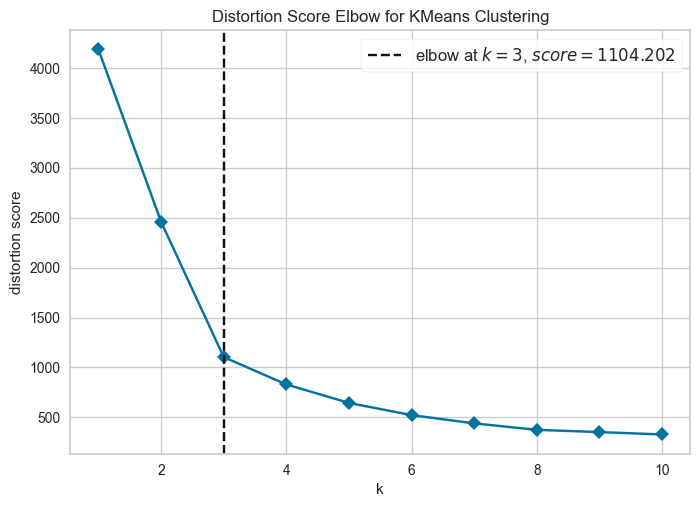

In [95]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
visualizer=KElbowVisualizer(KMeans(),k=(1,11),timings=False,metric="distortion")
visualizer.fit(pca_df)
visualizer.show()
plt.show()

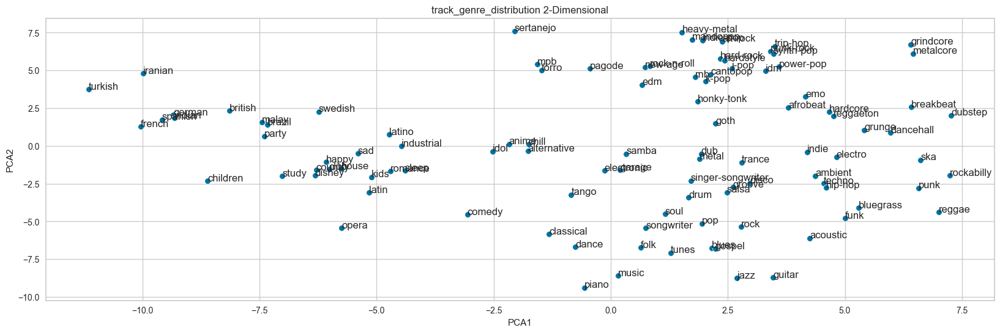

In [96]:
plt.figure(figsize=(20,6))
sns.scatterplot(x="PCA1",y="PCA2",data=pca_df)
for index,feature in enumerate(new_genre):
    plt.annotate(feature,xy=(new_vector[index,0],new_vector[index,1]))
plt.grid(True)
plt.title("track_genre_distribution 2-Dimensional")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.show()

In [97]:
from sklearn.cluster import KMeans

# Choose number of clusters (example: 5)
mean = KMeans(n_clusters=3, random_state=42)

# Fit the model on your PCA data
mean.fit(pca_df)


,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [98]:
mean.cluster_centers_

array([[ 2.4531388 , -4.027061  ],
       [ 2.7736583 ,  4.687566  ],
       [-6.3325596 , -0.07739616]], dtype=float32)

In [99]:
mean.labels_

array([0, 1, 1, 2, 0, 2, 0, 0, 0, 2, 1, 2, 1, 2, 2, 2, 0, 2, 0, 2, 0, 1,
       0, 0, 2, 0, 0, 1, 1, 0, 0, 1, 0, 1, 2, 0, 0, 2, 0, 1, 1, 0, 1, 0,
       2, 1, 1, 1, 1, 0, 1, 1, 2, 1, 0, 2, 2, 2, 1, 0, 0, 1, 2, 2, 2, 2,
       1, 1, 1, 1, 2, 1, 2, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 2, 2, 0, 0, 1,
       0, 0, 0, 2, 0, 0, 2, 2, 2, 1, 0, 0, 1, 2, 0], dtype=int32)

In [100]:
from sklearn.metrics import silhouette_score
print(silhouette_score(pca_df,mean.labels_,metric="manhattan"))

0.5024383876563568


In [101]:
from sklearn.metrics import silhouette_score
print(silhouette_score(pca_df,mean.labels_,metric="euclidean"))

0.5155482888221741


In [102]:
pca_df["cluster"]=mean.fit_predict(pca_df)

In [103]:
pca_df.head()

,PCA1,PCA2,cluster
acoustic,4.248389,-6.104922,0
afrobeat,3.790117,2.527386,1
alt-rock,2.378515,6.926713,1
alternative,-1.769233,-0.332964,2
ambient,4.365935,-1.976140,0


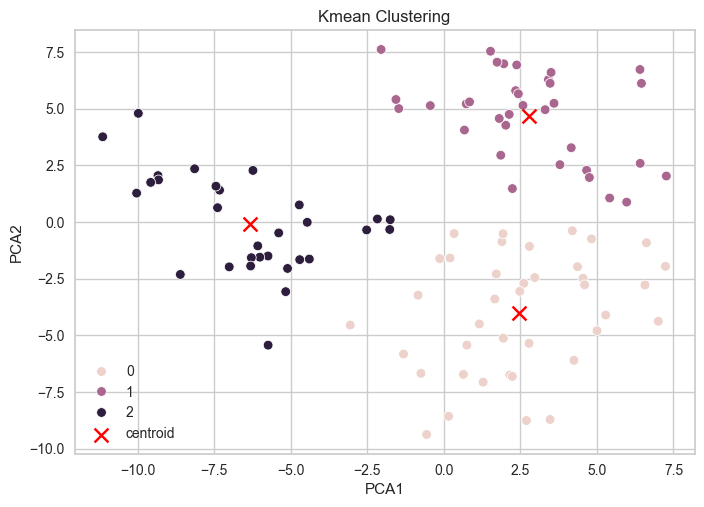

In [104]:
sns.scatterplot(x=pca_df["PCA1"],y=pca_df["PCA2"],hue=pca_df["cluster"])
plt.scatter(mean.cluster_centers_[:,0],mean.cluster_centers_[:,1],marker="x",color="red",s=100,label="centroid")
plt.legend()
plt.title("Kmean Clustering")
plt.show()

In [105]:
for i in range(3):
    genre_=pca_df[pca_df["cluster"]==i].index.tolist()
    print(i)
    print(genre_)
    print("--")

0
['acoustic', 'ambient', 'metal', 'bluegrass', 'blues', 'classical', 'comedy', 'dance', 'techno', 'disco', 'drum', 'dub', 'electro', 'electronic', 'folk', 'funk', 'garage', 'gospel', 'groove', 'guitar', 'hip-hop', 'indie', 'rock', 'jazz', 'piano', 'pop', 'punk', 'reggae', 'rockabilly', 'salsa', 'samba', 'tunes', 'singer-songwriter', 'ska', 'songwriter', 'soul', 'tango', 'trance', 'music']
--
1
['afrobeat', 'alt-rock', 'breakbeat', 'cantopop', 'dancehall', 'dubstep', 'edm', 'emo', 'forro', 'goth', 'grindcore', 'grunge', 'hard-rock', 'hardcore', 'hardstyle', 'heavy-metal', 'honky-tonk', 'idm', 'indie-pop', 'j-pop', 'k-pop', 'mandopop', 'metalcore', 'mpb', 'new-age', 'pagode', 'power-pop', 'punk-rock', 'rnb', 'reggaeton', 'rock-n-roll', 'sertanejo', 'synth-pop', 'trip-hop']
--
2
['alternative', 'anime', 'brazil', 'british', 'house', 'children', 'chill', 'club', 'country', 'disney', 'french', 'german', 'happy', 'indian', 'industrial', 'iranian', 'idol', 'kids', 'latin', 'latino', 'malay',

In [106]:
# Define cluster-to-genre mapping
genre_to_cluster = {
    # Cluster 0
    'acoustic': 0, 'ambient': 0, 'anime': 0, 'metal': 0, 'bluegrass': 0, 'blues': 0, 'chill': 0, 
    'classical': 0, 'comedy': 0, 'dance': 0, 'techno': 0, 'disco': 0, 'drum': 0, 'dub': 0, 
    'electro': 0, 'electronic': 0, 'folk': 0, 'funk': 0, 'garage': 0, 'gospel': 0, 'groove': 0, 
    'guitar': 0, 'hardcore': 0, 'hip-hop': 0, 'indie': 0, 'idol': 0, 'rock': 0, 'jazz': 0, 
    'piano': 0, 'pop': 0, 'punk': 0, 'reggae': 0, 'rockabilly': 0, 'salsa': 0, 'samba': 0, 
    'tunes': 0, 'singer-songwriter': 0, 'ska': 0, 'songwriter': 0, 'soul': 0, 'tango': 0, 
    'trance': 0, 'music': 0,

    # Cluster 1
    'afrobeat': 1, 'alt-rock': 1, 'breakbeat': 1, 'cantopop': 1, 'dancehall': 1, 'dubstep': 1, 
    'edm': 1, 'emo': 1, 'forro': 1, 'goth': 1, 'grindcore': 1, 'grunge': 1, 'hard-rock': 1, 
    'hardstyle': 1, 'heavy-metal': 1, 'honky-tonk': 1, 'idm': 1, 'indie-pop': 1, 'j-pop': 1, 
    'k-pop': 1, 'mandopop': 1, 'metalcore': 1, 'mpb': 1, 'new-age': 1, 'pagode': 1, 'power-pop': 1, 
    'punk-rock': 1, 'rnb': 1, 'reggaeton': 1, 'rock-n-roll': 1, 'sertanejo': 1, 'synth-pop': 1, 
    'trip-hop': 1,

    # Cluster 2
    'alternative': 2, 'brazil': 2, 'british': 2, 'house': 2, 'children': 2, 'club': 2, 'country': 2, 
    'disney': 2, 'french': 2, 'german': 2, 'happy': 2, 'indian': 2, 'industrial': 2, 'iranian': 2, 
    'kids': 2, 'latin': 2, 'latino': 2, 'malay': 2, 'opera': 2, 'party': 2, 'romance': 2, 'sad': 2, 
    'sleep': 2, 'spanish': 2, 'study': 2, 'swedish': 2, 'turkish': 2
}



In [107]:
df["track_genre"]=df["track_genre"].map(genre_to_cluster)

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113999 entries, 0 to 113998
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        113999 non-null  int64  
 1   duration_ms       113999 non-null  int64  
 2   explicit          113999 non-null  bool   
 3   danceability      113999 non-null  float64
 4   energy            113999 non-null  float64
 5   key               113999 non-null  int64  
 6   loudness          113999 non-null  float64
 7   mode              113999 non-null  int64  
 8   speechiness       113999 non-null  float64
 9   acousticness      113999 non-null  float64
 10  instrumentalness  113999 non-null  float64
 11  liveness          113999 non-null  float64
 12  valence           113999 non-null  float64
 13  tempo             113999 non-null  float64
 14  time_signature    113999 non-null  int64  
 15  track_genre       113999 non-null  int64  
dtypes: bool(1), float64(

In [109]:
df.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,0
1,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,0
2,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,0
3,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,0
4,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,0


In [110]:
popularity=df.groupby("track_genre")["popularity"].mean().reset_index()
popularity

,track_genre,popularity
0,0,34.128902
1,1,35.007697
2,2,29.780000


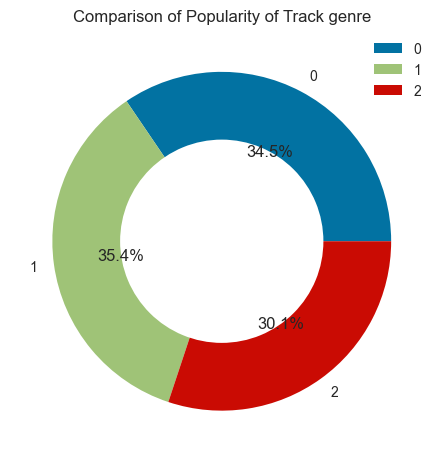

In [111]:
plt.pie(popularity["popularity"],labels=popularity["track_genre"],autopct="%1.1f%%")
plt.pie([1],radius=0.6,colors="white")
plt.legend(loc=1)
plt.title("Comparison of Popularity of Track genre")
plt.show()

In [112]:
from scipy.stats import f_oneway
ho="all Track_genre has equal popularity"
h1="All track -genre has non equal popularity"

track_genre_0=df[df["track_genre"]==0]["popularity"]
track_genre_1=df[df["track_genre"]==1]["popularity"]
track_genre_2=df[df["track_genre"]==1]["popularity"]

f_stats,p_value=f_oneway(track_genre_0,track_genre_1,track_genre_2)

print(f_stats)
print(p_value)

if p_value>0.05:
    print("We failed to reject the null hypothesis")
else:
    print("We reject the null hypothesis")

23.792961191959563
4.6660469253320686e-11
We reject the null hypothesis


In [113]:
pd.crosstab(df["explicit"],df["track_genre"])

track_genre,0,1,2
explicit,,,
False,46594,30354,27304
True,4406,2645,2696


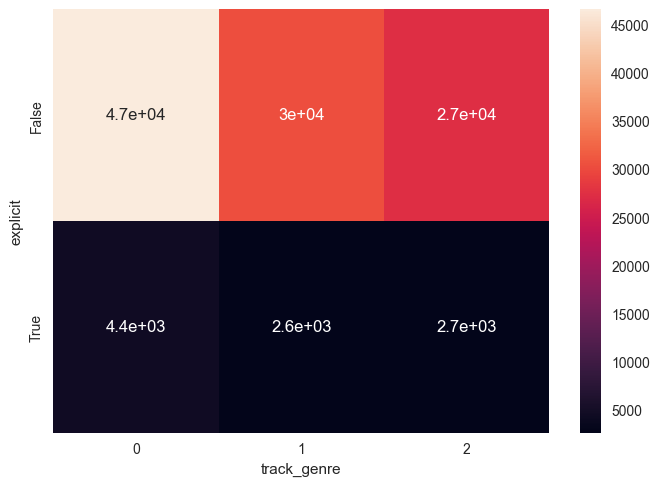

In [114]:
sns.heatmap(pd.crosstab(df["explicit"],df["track_genre"]),annot=True)
plt.show()

In [115]:
df.columns

Index(['popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

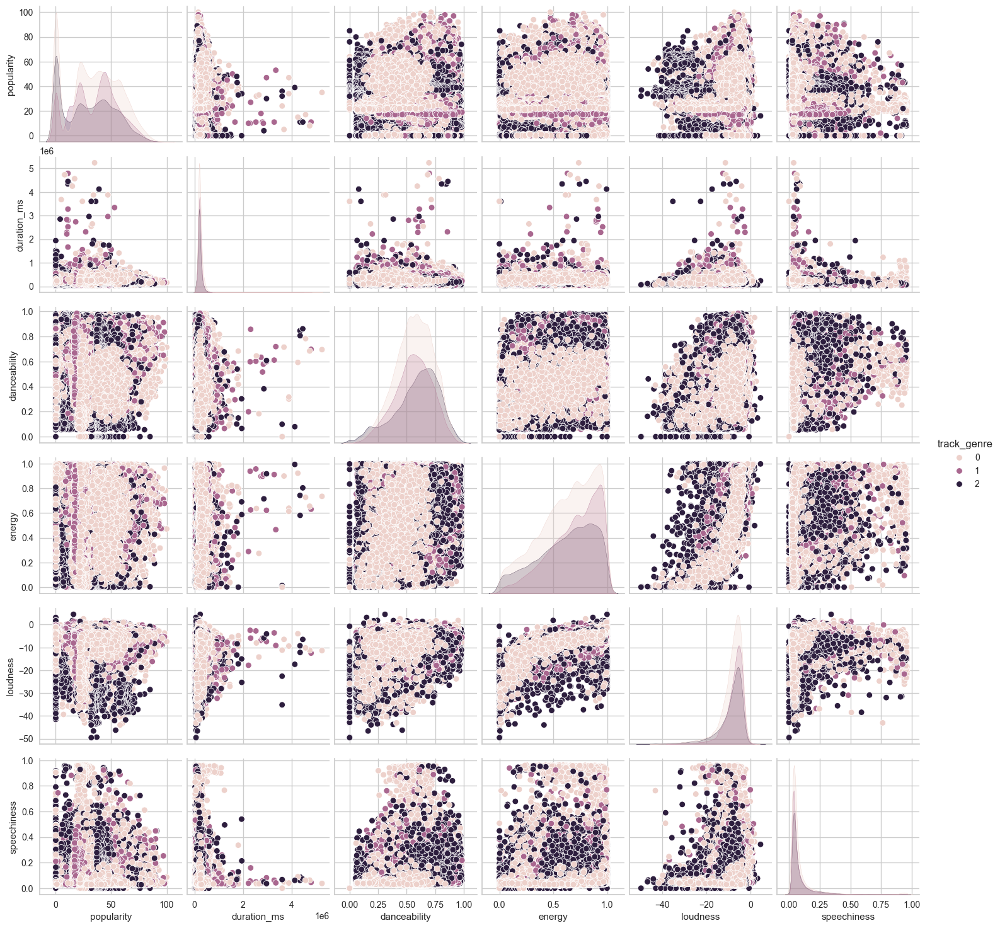

In [116]:
sns.pairplot(df,vars=['popularity', 'duration_ms','danceability', 'energy', 'loudness',"speechiness"],hue="track_genre",kind="scatter")
plt.show()

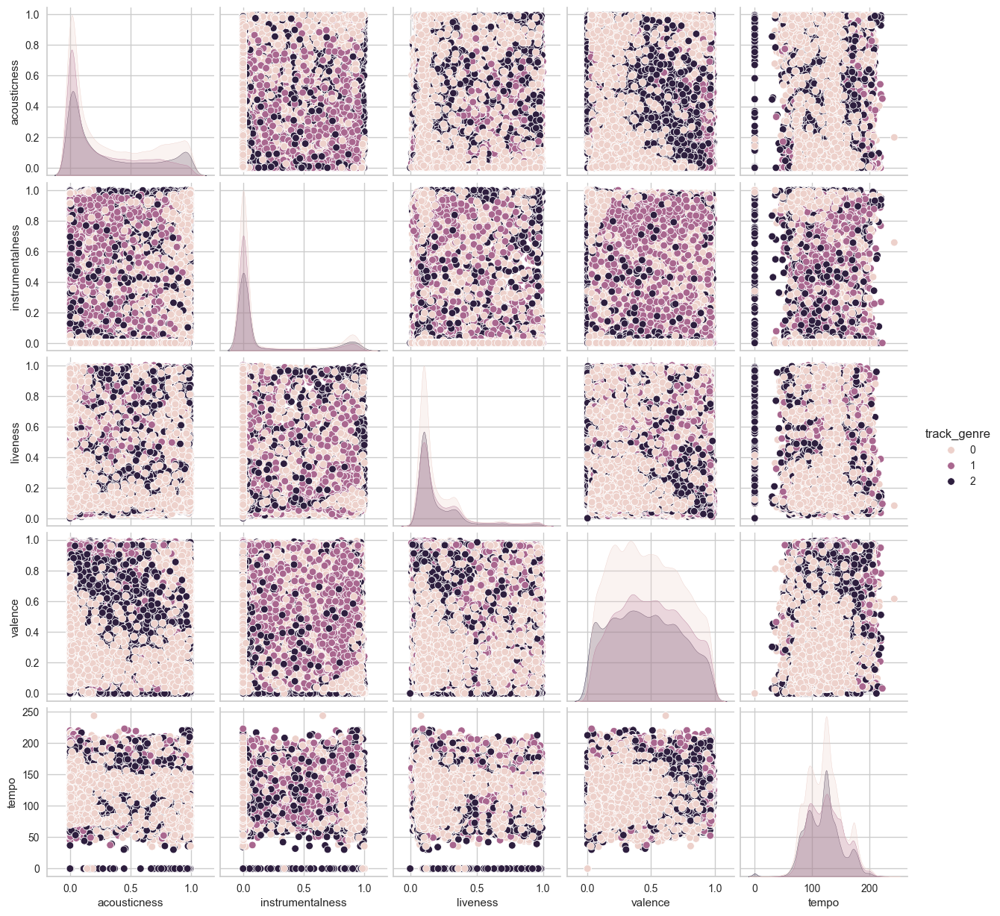

In [117]:
sns.pairplot(df,vars=['acousticness','instrumentalness', 'liveness', 'valence', 'tempo'],hue="track_genre",kind="scatter")
plt.show()

In [128]:
x=df.loc[:,['popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']]
y=df.loc[:,["track_genre"]]

In [129]:
x.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4
1,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4
2,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4
3,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3
4,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4


In [130]:
y.head()

,track_genre
0,0
1,0
2,0
3,0
4,0


In [131]:
df.columns

Index(['popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

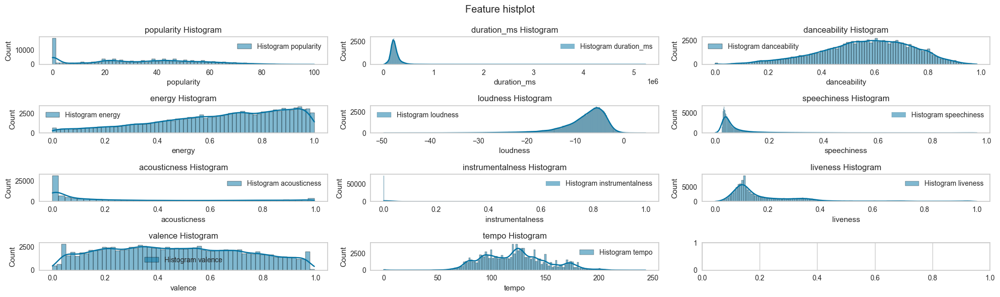

In [122]:
col=['popularity', 'duration_ms', 'danceability', 'energy','loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo']
fig,ax=plt.subplots(4,3,figsize=(20,6))
for index,feature in enumerate(col):
    row=index//3
    col=index%3
    sns.histplot(df[feature],kde=True,alpha=0.5,ax=ax[row,col],label="Histogram {}".format(feature))
    ax[row,col].set_title("{} Histogram".format(feature))
    ax[row,col].grid()
    ax[row,col].legend()
    
plt.suptitle("Feature histplot")
plt.tight_layout()
plt.show()

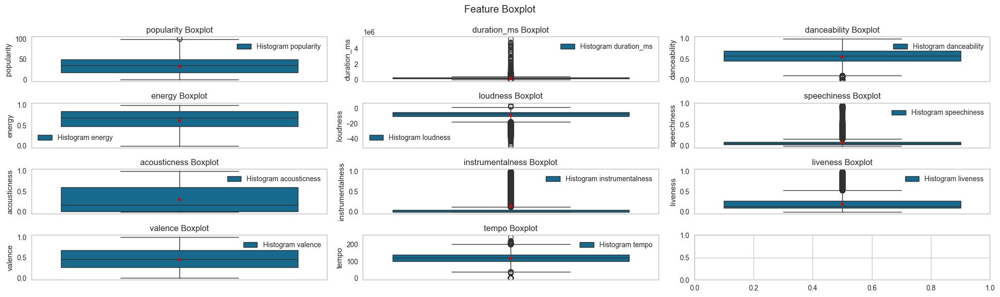

In [123]:
col=['popularity', 'duration_ms', 'danceability', 'energy','loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo']
fig,ax=plt.subplots(4,3,figsize=(20,6))
for index,feature in enumerate(col):
    row=index//3
    col=index%3
    sns.boxplot(df[feature],showmeans=True,ax=ax[row,col],label="Histogram {}".format(feature))
    ax[row,col].set_title("{} Boxplot".format(feature))
    ax[row,col].grid()
    ax[row,col].legend()
    
plt.suptitle("Feature Boxplot")
plt.tight_layout()  
plt.show()

#### Feature Seletion

In [124]:
corr=df.corr()
corr

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
popularity,1.000000,-0.007129,0.044078,0.035444,0.001053,-0.003847,0.050420,-0.013948,-0.044930,-0.025458,-0.095147,-0.005397,-0.040522,0.013212,0.031076,-0.071315
duration_ms,-0.007129,1.000000,-0.065270,-0.073435,0.058520,0.008123,-0.003475,-0.035581,-0.062605,-0.103770,0.124364,0.010308,-0.154464,0.024356,0.018229,-0.071995
explicit,0.044078,-0.065270,1.000000,0.122506,0.096954,0.004485,0.108587,-0.037216,0.307951,-0.094400,-0.103405,0.032547,-0.003378,-0.002815,0.038387,0.003261
danceability,0.035444,-0.073435,0.122506,1.000000,0.134325,0.036470,0.259076,-0.069224,0.108625,-0.171531,-0.185608,-0.131620,0.477347,-0.050448,0.207219,0.042737
energy,0.001053,0.058520,0.096954,0.134325,1.000000,0.048007,0.761690,-0.078365,0.142508,-0.733908,-0.181880,0.184795,0.258937,0.247852,0.187127,-0.010359
key,-0.003847,0.008123,0.004485,0.036470,0.048007,1.000000,0.038591,-0.135911,0.020419,-0.040942,-0.006821,-0.001597,0.034099,0.010914,0.015064,0.001751
loudness,0.050420,-0.003475,0.108587,0.259076,0.761690,0.038591,1.000000,-0.041768,0.060826,-0.589804,-0.433478,0.076897,0.279851,0.212447,0.191992,-0.029229
mode,-0.013948,-0.035581,-0.037216,-0.069224,-0.078365,-0.135911,-0.041768,1.000000,-0.046535,0.095568,-0.049961,0.014004,0.021964,0.000572,-0.024090,-0.028336
speechiness,-0.044930,-0.062605,0.307951,0.108625,0.142508,0.020419,0.060826,-0.046535,1.000000,-0.002184,-0.089617,0.205218,0.036637,0.017274,-0.000011,-0.020559
acousticness,-0.025458,-0.103770,-0.094400,-0.171531,-0.733908,-0.040942,-0.589804,0.095568,-0.002184,1.000000,0.104033,-0.020693,-0.107081,-0.208231,-0.176142,-0.017498


In [125]:
track_genre_=corr["track_genre"].sort_values(ascending=False).reset_index()
track_genre_

,index,track_genre
0,track_genre,1.000000
1,danceability,0.042737
2,instrumentalness,0.016973
3,explicit,0.003261
4,key,0.001751
5,liveness,-0.004269
6,energy,-0.010359
7,time_signature,-0.014896
8,acousticness,-0.017498
9,speechiness,-0.020559


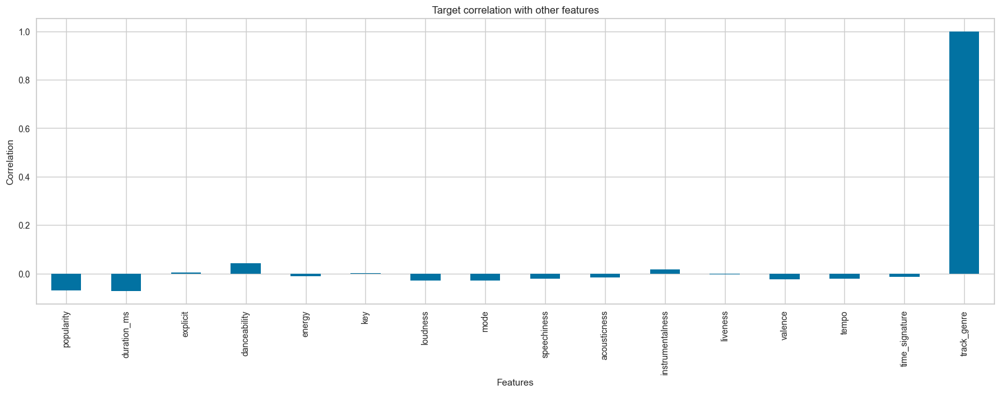

In [126]:
plt.figure(figsize=(20,6))
corr["track_genre"].plot(kind="bar")
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.title("Target correlation with other features")
plt.show()

In [132]:
mapp={False:0,True:1}
df["explicit"]=df["explicit"].map(mapp)

In [133]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [140]:
for index,feature in enumerate(x_train.columns):
    print(index,"->",feature,"->",x_train[feature].skew())

0 -> popularity -> 0.045427896959410755
1 -> duration_ms -> 11.573521123177922
2 -> explicit -> 2.9513910605656237
3 -> danceability -> -0.3971986863620153
4 -> energy -> -0.596080787751938
5 -> key -> -0.008931422766835583
6 -> loudness -> -2.0085058405616074
7 -> mode -> -0.5732323013865314
8 -> speechiness -> 4.636628871970893
9 -> acousticness -> 0.7241486862876022
10 -> instrumentalness -> 1.7249093009584833
11 -> liveness -> 2.1123146285460535
12 -> valence -> 0.11609991997794851
13 -> tempo -> 0.2345847970048899
14 -> time_signature -> -4.092230962457576


In [134]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer

more_skewed=["duration_ms","loudness","speechiness","instrumentalness","liveness","time_signature"]
preprocess=ColumnTransformer(transformers=[
    ("trf1",PowerTransformer(),more_skewed)
],remainder="passthrough")

In [135]:
x_train_transform=preprocess.fit_transform(x_train)
x_test_transform=preprocess.transform(x_test)

In [136]:
x_train_transform_df = pd.DataFrame(x_train_transform, columns=x_train.columns, index=x_train.index)
x_test_transform_df = pd.DataFrame(x_test_transform, columns=x_test.columns, index=x_test.index)

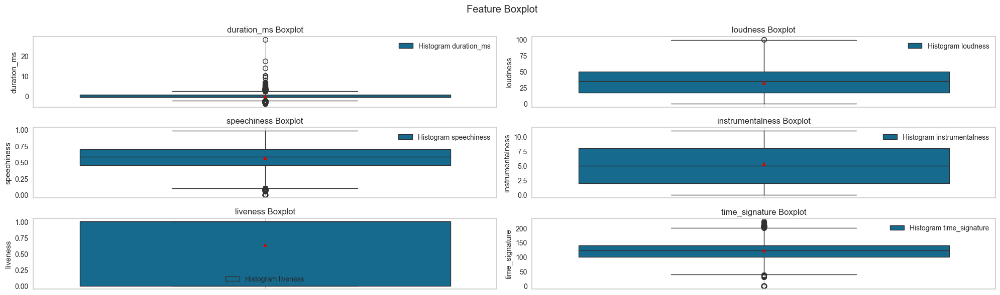

In [137]:
col=["duration_ms","loudness","speechiness","instrumentalness","liveness","time_signature"]
fig,ax=plt.subplots(3,2,figsize=(20,6))
for index,feature in enumerate(col):
    row=index//2
    col=index%2
    sns.boxplot(x_train_transform_df[feature],showmeans=True,ax=ax[row,col],label="Histogram {}".format(feature))
    ax[row,col].set_title("{} Boxplot".format(feature))
    ax[row,col].grid()
    ax[row,col].legend()
    
plt.suptitle("Feature Boxplot")
plt.tight_layout()  
plt.show()

In [142]:
for index,feature in enumerate(x_train_transform_df.columns):
    print(index,"->",feature,"->",x_train_transform_df[feature].skew())

0 -> popularity -> 0.05351218348124764
1 -> duration_ms -> 0.16899926064240925
2 -> explicit -> 0.669653884752494
3 -> danceability -> 1.2607698356641053
4 -> energy -> 0.3724824857323254
5 -> key -> 0.8217271601165609
6 -> loudness -> 0.045427896959410755
7 -> mode -> 2.9513910605656237
8 -> speechiness -> -0.3971986863620153
9 -> acousticness -> -0.596080787751938
10 -> instrumentalness -> -0.008931422766835583
11 -> liveness -> -0.5732323013865314
12 -> valence -> 0.7241486862876022
13 -> tempo -> 0.11609991997794851
14 -> time_signature -> 0.2345847970048899


In [143]:
from sklearn.feature_selection import mutual_info_classif
mi_scores=mutual_info_classif(x_train_transform_df,y_train,discrete_features="auto")
mi_df=pd.DataFrame({"Features":x.columns,"mi_score":mi_scores})
mi_df_df=mi_df.sort_values(by="mi_score",ascending=False)
mi_df_df


,Features,mi_score
0,popularity,0.047693
14,time_signature,0.042680
1,duration_ms,0.036734
6,loudness,0.031110
12,valence,0.021251
8,speechiness,0.019521
9,acousticness,0.017964
2,explicit,0.013755
3,danceability,0.011184
13,tempo,0.008679


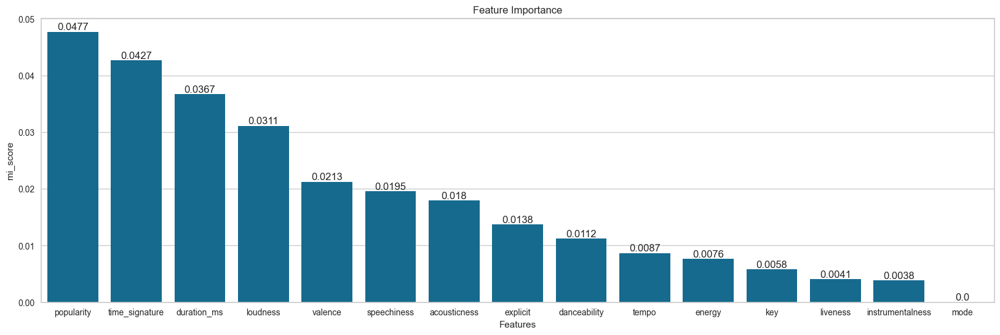

In [145]:
plt.figure(figsize=(20,6))
bar=sns.barplot(x="Features",y="mi_score",data=mi_df_df)
for i in bar.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,4)}",ha="center",va="bottom")
plt.title("Feature Importance")
plt.show()

In [147]:
x_train_transform_df.drop(["mode"],axis=1,inplace=True)
x_test_transform_df.drop(["mode"],axis=1,inplace=True)

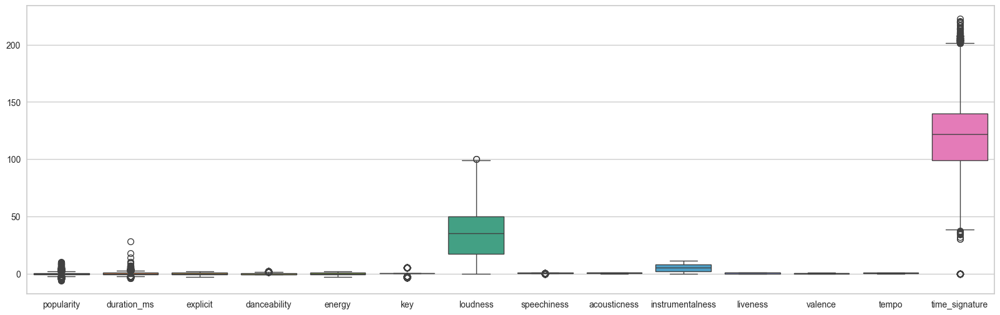

In [148]:
plt.figure(figsize=(20,6))
sns.boxplot(x_train_transform_df)
plt.show()

In [149]:
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
x_train_norm=scalar.fit_transform(x_train_transform_df)
x_test_norm=scalar.transform(x_test_transform_df)

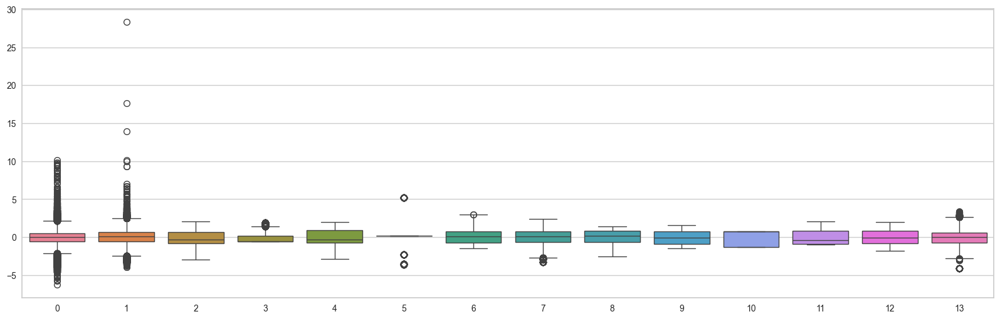

In [150]:
plt.figure(figsize=(20,6))
sns.boxplot(x_train_norm)
plt.show()

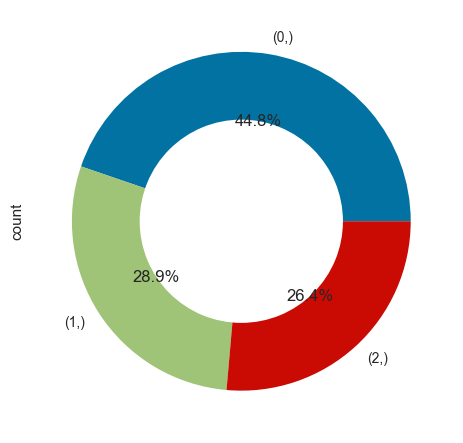

In [151]:
y_train.value_counts().plot(kind="pie",autopct="%1.1f%%")
plt.pie([1],colors="white",radius=0.6)
plt.show()

In [152]:
! pip uninstall imbalanced-learn -y
! pip install imbalanced-learn


Found existing installation: imbalanced-learn 0.14.0
Uninstalling imbalanced-learn-0.14.0:
  Successfully uninstalled imbalanced-learn-0.14.0
  Using cached imbalanced_learn-0.14.0-py3-none-any.whl (239 kB)



[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [153]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(x_train_norm, y_train)


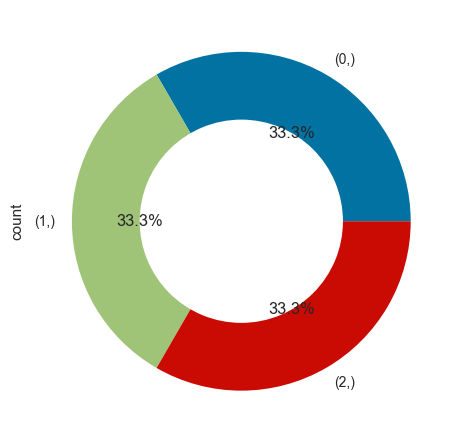

In [154]:
y_train_resampled.value_counts().plot(kind="pie",autopct="%1.1f%%")
plt.pie([1],colors="white",radius=0.6)
plt.show()

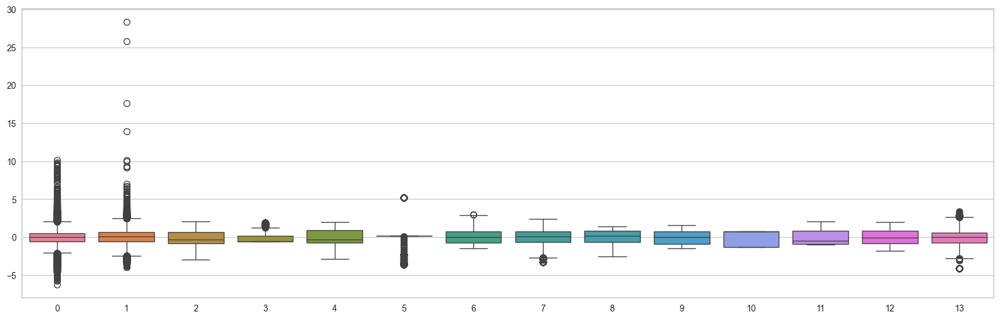

In [155]:
plt.figure(figsize=(20,6))
sns.boxplot(X_train_resampled)
plt.show()

#### Model

#### Logistic Regression

In [156]:
from sklearn.linear_model import LogisticRegression
logic=LogisticRegression()
logic.fit(X_train_resampled,y_train_resampled)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [157]:
train_accuracy=logic.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.42582610542134236


In [158]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(logic,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std. {score.std()}")

[0.42006615 0.42455796 0.42641294 0.43008821 0.4281689 ]
Mean: 0.42585883188404977
Std. 0.00342865704882168


In [159]:
y_pred_test_logic=logic.predict(x_test_norm)

In [160]:
y_pred_train_logic=logic.predict(X_train_resampled)

In [161]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred_test_logic))
print(accuracy_score(y_train_resampled,y_pred_train_logic))

0.3977631578947368
0.42582610542134236


In [162]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_test_logic))

              precision    recall  f1-score   support

           0       0.51      0.28      0.36     10186
           1       0.37      0.51      0.43      6682
           2       0.35      0.48      0.41      5932

    accuracy                           0.40     22800
   macro avg       0.41      0.42      0.40     22800
weighted avg       0.43      0.40      0.39     22800



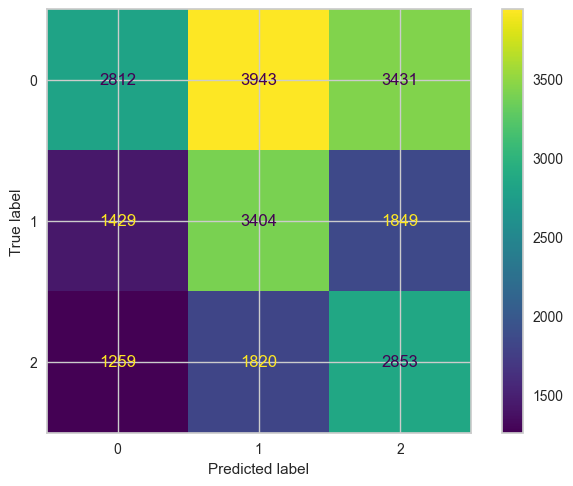

In [163]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,y_pred_test_logic)
ConfusionMatrixDisplay(cm).plot()
plt.show()

#### Decision Tree

In [165]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
# dtc=DecisionTreeClassifier(criterion="entropy",max_depth=10,min_samples_leaf=17,min_samples_split=13)
dtc.fit(X_train_resampled,y_train_resampled)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [166]:
train_accuracy=dtc.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.9178468172685843


In [167]:

from sklearn.model_selection import cross_val_score
score=cross_val_score(dtc,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std. {score.std()}")

[0.51235248 0.51561926 0.51339432 0.59629206 0.60592943]
Mean: 0.5487175108482325
Std. 0.04290030237058436


In [168]:
y_pred_test_dtc=dtc.predict(x_test_norm)

In [169]:
y_pred_train_dtc=dtc.predict(X_train_resampled)

In [170]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred_test_dtc))
print(accuracy_score(y_train_resampled,y_pred_train_dtc))

0.47969298245614034
0.9178468172685843


In [171]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_test_dtc))

              precision    recall  f1-score   support

           0       0.54      0.55      0.55     10186
           1       0.42      0.41      0.42      6682
           2       0.43      0.43      0.43      5932

    accuracy                           0.48     22800
   macro avg       0.47      0.46      0.47     22800
weighted avg       0.48      0.48      0.48     22800



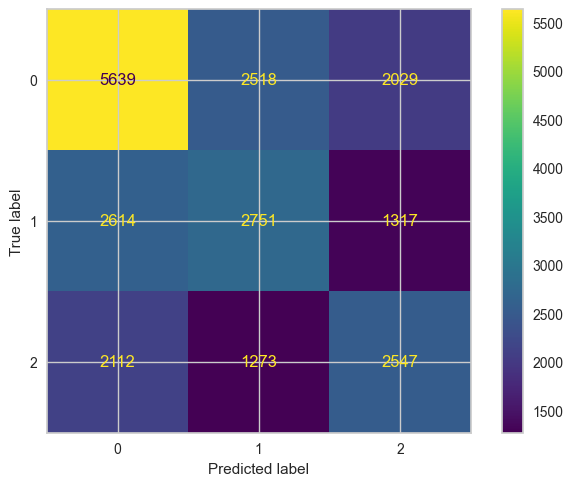

In [172]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,y_pred_test_dtc)
ConfusionMatrixDisplay(cm).plot()
plt.show()

In [173]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3,5,10],       
    'min_samples_split':[13,15,19,21],    
    'min_samples_leaf': [17,19,21,None],      
    'max_features': ['sqrt', 'log2', None]     
}
grid=GridSearchCV(DecisionTreeClassifier(),param_grid=param_grid,cv=5,n_jobs=-1,scoring="accuracy")
grid.fit(X_train_resampled,y_train_resampled)

print(grid.best_score_)
print(grid.best_params_)

0.5110176319554843
{'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 17, 'min_samples_split': 13}


In [174]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier(criterion="gini",max_depth=10,min_samples_leaf=17,min_samples_split=13)
dtc.fit(X_train_resampled,y_train_resampled)

,criterion,'gini'
,splitter,'best'
,max_depth,10
,min_samples_split,13
,min_samples_leaf,17
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [175]:
train_accuracy=dtc.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.5327583672269319


In [176]:

from sklearn.model_selection import cross_val_score
score=cross_val_score(dtc,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std. {score.std()}")

[0.50402221 0.49712116 0.50837145 0.52168409 0.52376674]
Mean: 0.5109931301586859
Std. 0.010250466875060371


In [177]:
y_pred_test_dtc=dtc.predict(x_test_norm)

In [178]:
y_pred_train_dtc=dtc.predict(X_train_resampled)

In [179]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred_test_dtc))
print(accuracy_score(y_train_resampled,y_pred_train_dtc))

0.48951754385964913
0.5327583672269319


In [180]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_test_dtc))

              precision    recall  f1-score   support

           0       0.61      0.42      0.50     10186
           1       0.42      0.60      0.49      6682
           2       0.46      0.48      0.47      5932

    accuracy                           0.49     22800
   macro avg       0.50      0.50      0.49     22800
weighted avg       0.51      0.49      0.49     22800



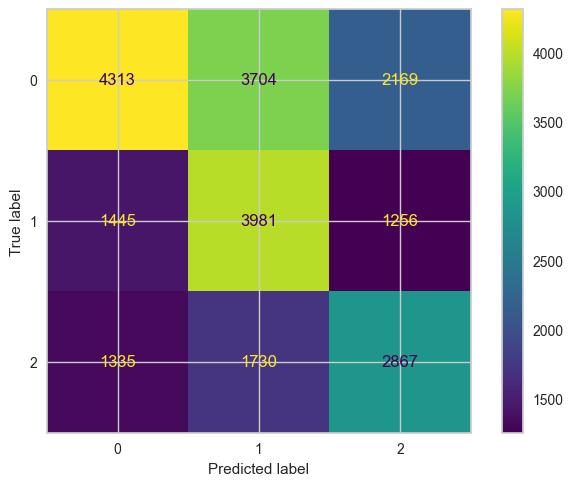

In [181]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,y_pred_test_dtc)
ConfusionMatrixDisplay(cm).plot()
plt.show()

In [182]:
importance=dtc.feature_importances_

In [184]:
feat_importance_df=pd.DataFrame({"feature":x_train_transform_df.columns,"Importance":importance})
feat_importance_df_df=feat_importance_df.sort_values(by="Importance",ascending=False)
feat_importance_df_df

,feature,Importance
6,loudness,0.248325
7,speechiness,0.139159
0,popularity,0.129168
11,valence,0.116707
3,danceability,0.095377
12,tempo,0.083004
2,explicit,0.051080
1,duration_ms,0.043100
13,time_signature,0.028564
8,acousticness,0.028301


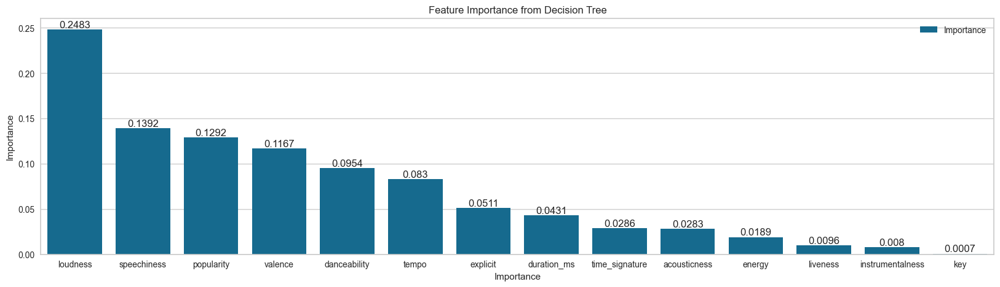

In [186]:
plt.figure(figsize=(20,5))
bar=sns.barplot(x=feat_importance_df_df['feature'], y=feat_importance_df_df['Importance'],label="Importance")
for i in bar.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,4)}",ha="center",va="bottom")
plt.xlabel("Importance")
plt.title("Feature Importance from Decision Tree")
plt.show()

#### Random Forest

In [187]:
from sklearn.ensemble import RandomForestClassifier
forest=RandomForestClassifier()
# forest=RandomForestClassifier(min_samples_split=15,min_samples_leaf=13,max_features="log2")
forest.fit(X_train_resampled,y_train_resampled)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [188]:
train_accuracy=forest.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.9178468172685843


In [189]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(forest,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std. {score.std()}")

[0.60766058 0.61051901 0.61242241 0.7286426  0.73644234]
Mean: 0.6591373882751483
Std. 0.06000487888338278


In [190]:
y_pred_forest_test=forest.predict(x_test_norm)
y_pred_forest_train=forest.predict(X_train_resampled)

In [191]:
print(accuracy_score(y_test,y_pred_forest_test))
print(accuracy_score(y_train_resampled,y_pred_forest_train))

0.5527631578947368
0.9178468172685843


In [192]:
print(classification_report(y_test,y_pred_forest_test))

              precision    recall  f1-score   support

           0       0.62      0.58      0.60     10186
           1       0.49      0.53      0.51      6682
           2       0.52      0.53      0.52      5932

    accuracy                           0.55     22800
   macro avg       0.54      0.55      0.54     22800
weighted avg       0.56      0.55      0.55     22800



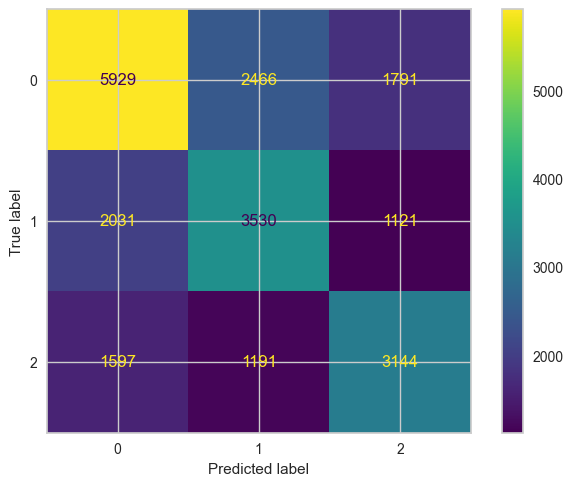

In [193]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,y_pred_forest_test)
ConfusionMatrixDisplay(cm).plot()
plt.show()

In [194]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
param_dist = {
    'max_depth': [5, 7,10, None],
    'min_samples_split':[11,13,15,17,21],
    'min_samples_leaf': [13,15,17,19,21],
    'max_features': ['sqrt', 'log2']
}

# Set up random search
random_search = RandomizedSearchCV(
    RandomForestClassifier(random_state=42),
    param_distributions=param_dist,
    n_iter=20,          
    scoring='f1_weighted',
    cv=3,
    random_state=42,
    n_jobs=-1
)

random_search.fit(X_train_resampled,y_train_resampled)

print(random_search.best_score_)
print(random_search.best_params_)

0.6113112781522146
{'min_samples_split': 15, 'min_samples_leaf': 13, 'max_features': 'log2', 'max_depth': None}


In [195]:
from sklearn.ensemble import RandomForestClassifier
forest=RandomForestClassifier(min_samples_split=15,min_samples_leaf=13,max_features="log2")
forest.fit(X_train_resampled,y_train_resampled)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,15
,min_samples_leaf,13
,min_weight_fraction_leaf,0.0
,max_features,'log2'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [196]:
train_accuracy=forest.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.7798549517322487


In [197]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(forest,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std. {score.std()}")

[0.58948916 0.59369513 0.59555701 0.65836328 0.66334531]
Mean: 0.62008997725999
Std. 0.03337913853838838


In [198]:
y_pred_forest_test=forest.predict(x_test_norm)
y_pred_forest_train=forest.predict(X_train_resampled)

In [199]:
print(accuracy_score(y_test,y_pred_forest_test))
print(accuracy_score(y_train_resampled,y_pred_forest_train))

0.5603947368421053
0.7798549517322487


In [200]:
print(classification_report(y_test,y_pred_forest_test))

              precision    recall  f1-score   support

           0       0.65      0.55      0.60     10186
           1       0.50      0.58      0.53      6682
           2       0.51      0.56      0.54      5932

    accuracy                           0.56     22800
   macro avg       0.55      0.56      0.56     22800
weighted avg       0.57      0.56      0.56     22800



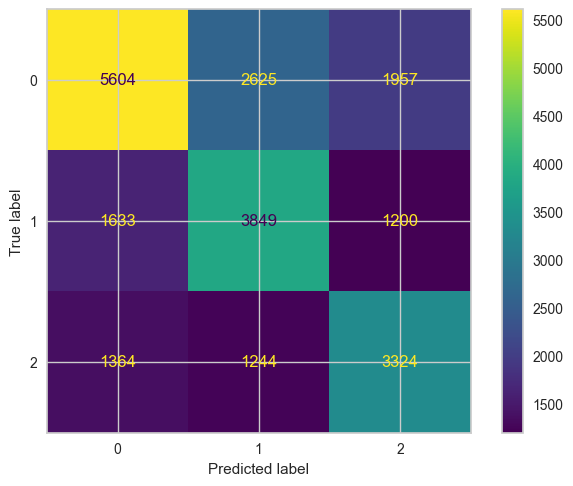

In [201]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm=confusion_matrix(y_test,y_pred_forest_test)
ConfusionMatrixDisplay(cm).plot()
plt.show()

#### XGboost

In [202]:
! pip install xgboost

     ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
     ---------------------------------------- 0.2/72.0 MB 10.2 MB/s eta 0:00:08
     ---------------------------------------- 0.3/72.0 MB 5.1 MB/s eta 0:00:14
     ---------------------------------------- 0.6/72.0 MB 5.1 MB/s eta 0:00:15
     ---------------------------------------- 0.7/72.0 MB 5.2 MB/s eta 0:00:14
      --------------------------------------- 1.0/72.0 MB 4.7 MB/s eta 0:00:16
      --------------------------------------- 1.3/72.0 MB 5.2 MB/s eta 0:00:14
      --------------------------------------- 1.5/72.0 MB 5.1 MB/s eta 0:00:14
     - -------------------------------------- 1.8/72.0 MB 5.3 MB/s eta 0:00:14
     - -------------------------------------- 2.1/72.0 MB 5.7 MB/s eta 0:00:13
     - -------------------------------------- 2.5/72.0 MB 5.9 MB/s eta 0:00:12
     - -------------------------------------- 2.8/72.0 MB 5.7 MB/s eta 0:00:13
     - -------------------------------------- 3.2/72.0 MB 


[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [203]:
from xgboost import XGBClassifier
xgbc=XGBClassifier()
xgbc.fit(X_train_resampled,y_train_resampled)

,objective,'multi:softprob'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [204]:
train_accuracy=xgbc.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.6797749138367554


In [205]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(xgbc,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std.:{score.std()}")

[0.56564172 0.56939851 0.57571055 0.66359033 0.66167102]
Mean: 0.6072024253493782
Std.:0.045375303438081195


In [207]:
y_pred_test_xg=xgbc.predict(x_test_norm)
y_pred_train_xg=xgbc.predict(X_train_resampled)

In [208]:
print(accuracy_score(y_test,y_pred_test_xg))
print(accuracy_score(y_train_resampled,y_pred_train_xg))

0.5764035087719298
0.6797749138367554


In [209]:
print(classification_report(y_test,y_pred_test_xg))

              precision    recall  f1-score   support

           0       0.63      0.62      0.63     10186
           1       0.53      0.55      0.54      6682
           2       0.54      0.52      0.53      5932

    accuracy                           0.58     22800
   macro avg       0.57      0.57      0.57     22800
weighted avg       0.58      0.58      0.58     22800



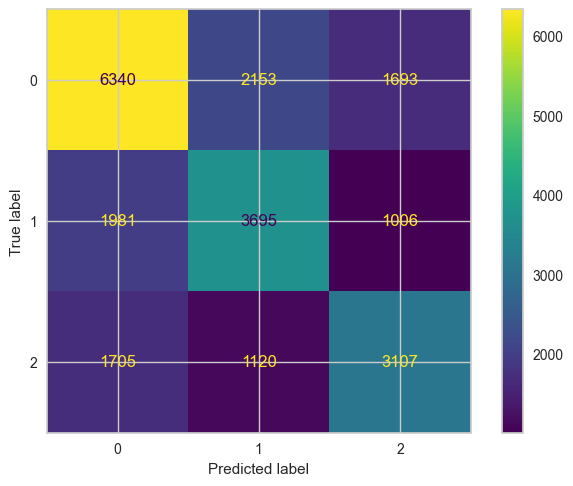

In [210]:
cm=confusion_matrix(y_test,y_pred_test_xg)
ConfusionMatrixDisplay(cm).plot()
plt.show()

In [ ]:
#This xgboost shows under fitting 
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV

# Expanded parameter grid to handle underfitting
param_grid = {
    'n_estimators': [50,100],  # more trees = more learning
    'max_depth': [4, 6, 8, 10],                  # deeper trees capture more complexity
    'learning_rate': [0.01, 0.05, 0.1, 0.2],     # moderate to small learning rates
    'min_child_weight': [1, 3, 5],               # smaller → more complex splits
    'gamma': [0, 0.1, 0.3, 0.5],                 # smaller → easier to split
    'subsample': [0.8, 0.9, 1],                  # more data per tree
    'colsample_bytree': [0.8, 0.9, 1],
    'reg_lambda': [0, 0.5, 1],                   # L2 regularization (helps generalize)
    'reg_alpha': [0, 0.5, 1]                     # L1 regularization
}

xgbc = XGBClassifier(
    objective='binary:logistic',
    random_state=42,
    eval_metric='logloss',
    use_label_encoder=False
)

grid_search = RandomizedSearchCV(
    estimator=xgb_clf,
    param_distributions=param_grid,
    n_iter=20,              
    scoring='accuracy',
    cv=5,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

grid_search.fit(X_train_resampled, y_train_resampled)

print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'subsample': 0.9, 'reg_lambda': 1, 'reg_alpha': 1, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.8}
Best Cross-Validation Score: 0.6282246845215653


In [214]:
from xgboost import XGBClassifier

xgbc = XGBClassifier(
    subsample=0.9,
    reg_lambda=1,
    reg_alpha=1,
    n_estimators=100,
    min_child_weight=1,
    max_depth=10,
    learning_rate=0.1,
    gamma=0.1,
    colsample_bytree=0.8,
    objective='binary:logistic',   # good default for classification
    eval_metric='logloss',
    random_state=42
)

xgbc.fit(X_train_resampled, y_train_resampled)


,objective,'multi:softprob'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.8
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


In [215]:
train_accuracy=xgbc.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.7617075839989546


In [216]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(xgbc,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std.:{score.std()}")

[0.58532402 0.58732492 0.59253512 0.69115485 0.69050147]
Mean: 0.6293680770259358
Std.:0.05023757485941839


In [217]:
y_pred_test_xg=xgbc.predict(x_test_norm)
y_pred_train_xg=xgbc.predict(X_train_resampled)

In [218]:
print(accuracy_score(y_test,y_pred_test_xg))
print(accuracy_score(y_train_resampled,y_pred_train_xg))

0.5774122807017544
0.7617075839989546


In [219]:
print(classification_report(y_test,y_pred_test_xg))

              precision    recall  f1-score   support

           0       0.64      0.61      0.62     10186
           1       0.52      0.56      0.54      6682
           2       0.55      0.54      0.54      5932

    accuracy                           0.58     22800
   macro avg       0.57      0.57      0.57     22800
weighted avg       0.58      0.58      0.58     22800



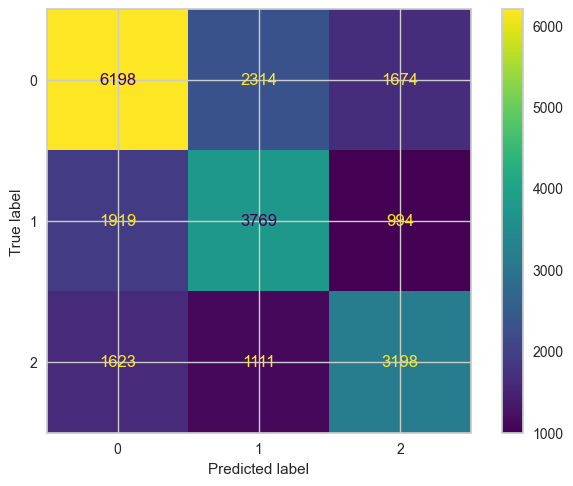

In [ ]:
cm=confusion_matrix(y_test,y_pred_test_xg)
ConfusionMatrixDisplay(cm).plot()
plt.show()

In [ ]:
#Now the model shows slight overfitting
from xgboost import XGBClassifier


# create the model
xgbc = XGBClassifier(
    n_estimators=300,
    max_depth=8,
    learning_rate=0.05,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_lambda=3,
    reg_alpha=2,
    gamma=0.2,
    random_state=42
)
xgbc.fit(X_train_resampled,y_train_resampled)





,objective,'multi:softprob'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.9
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [244]:
train_accuracy=xgbc.score(X_train_resampled,y_train_resampled)
print(train_accuracy)

0.7046764998938273


In [245]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(xgbc,X_train_resampled,y_train_resampled,cv=5)

print(score)
print(f"Mean: {score.mean()}")
print(f"Std.:{score.std()}")

[0.57830046 0.57968884 0.58567462 0.67257432 0.67441196]
Mean: 0.6181300392902539
Std.:0.045275401170230704


In [246]:
y_pred_test_xg=xgbc.predict(x_test_norm)
y_pred_train_xg=xgbc.predict(X_train_resampled)

In [247]:
print(accuracy_score(y_test,y_pred_test_xg))
print(accuracy_score(y_train_resampled,y_pred_train_xg))

0.5773684210526315
0.7046764998938273


In [248]:
print(classification_report(y_test,y_pred_test_xg))

              precision    recall  f1-score   support

           0       0.63      0.61      0.62     10186
           1       0.53      0.56      0.54      6682
           2       0.54      0.53      0.54      5932

    accuracy                           0.58     22800
   macro avg       0.57      0.57      0.57     22800
weighted avg       0.58      0.58      0.58     22800



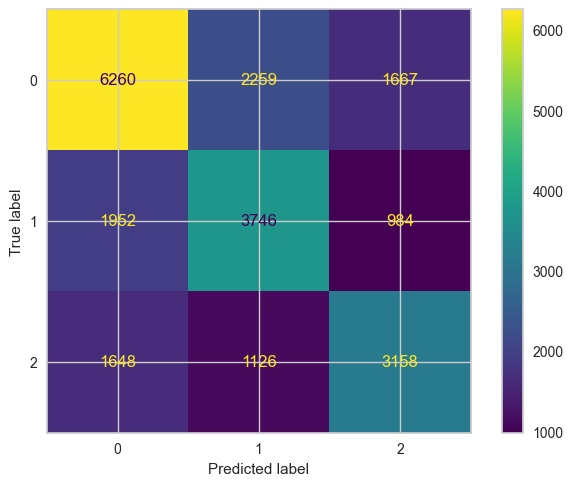

In [249]:
cm=confusion_matrix(y_test,y_pred_test_xg)
ConfusionMatrixDisplay(cm).plot()
plt.show()

#### ANN

In [221]:
! pip install tensorflow

  Using cached tensorflow-2.20.0-cp310-cp310-win_amd64.whl (331.7 MB)
  Using cached tensorboard-2.20.0-py3-none-any.whl (5.5 MB)
  Using cached libclang-18.1.1-py2.py3-none-win_amd64.whl (26.4 MB)
  Using cached gast-0.6.0-py3-none-any.whl (21 kB)
  Using cached opt_einsum-3.4.0-py3-none-any.whl (71 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Using cached absl_py-2.3.1-py3-none-any.whl (135 kB)
  Using cached flatbuffers-25.9.23-py2.py3-none-any.whl (30 kB)
     ---------------------------------------- 0.0/2.9 MB ? eta -:--:--
     -- ------------------------------------- 0.2/2.9 MB 6.1 MB/s eta 0:00:01
     ------- -------------------------------- 0.5/2.9 MB 6.4 MB/s eta 0:00:01
     ----------- ---------------------------- 0.8/2.9 MB 6.5 MB/s eta 0:00:01
     ---------------- ----------------------- 1.2/2.9 MB 7.7 MB/s eta 0:00:01
     -------------------- ------------------- 1.5/2.9 MB 7.1 MB/s eta 0:00:01
     ------------------------- -------------- 1.9/2.9 M


[notice] A new release of pip is available: 23.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [222]:
import keras

In [223]:
print(len(x_train_transform_df.columns)) 

14


In [224]:
from tensorflow.keras.models import Sequential #type:ignore
from tensorflow.keras.layers import Dense,Dropout #type:ignore

In [225]:
classification=Sequential()
classification.add(Dense(units=42,kernel_initializer="he_uniform",input_dim=14,activation="relu"))
classification.add(Dropout(0.2))

classification.add(Dense(units=28,kernel_initializer="he_uniform",activation="relu"))
classification.add(Dropout(0.2))

classification.add(Dense(units=14,kernel_initializer="he_uniform",activation="relu"))
classification.add(Dropout(0.2))

classification.add(Dense(units=3,kernel_initializer="glorot_uniform",activation="softmax"))

classification.compile(optimizer="adam",loss="sparse_categorical_crossentropy",metrics=["accuracy"])

In [226]:
from keras.callbacks import EarlyStopping
er=EarlyStopping(monitor="val_loss",patience=2,restore_best_weights=True)
model=classification.fit(X_train_resampled,y_train_resampled,validation_data=(x_test_norm,y_test),batch_size=1000,epochs=100)

Epoch 1/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.3366 - loss: 1.2382 - val_accuracy: 0.3204 - val_loss: 1.1013
Epoch 2/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3623 - loss: 1.1006 - val_accuracy: 0.3661 - val_loss: 1.0879
Epoch 3/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3780 - loss: 1.0893 - val_accuracy: 0.3661 - val_loss: 1.0805
Epoch 4/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3910 - loss: 1.0820 - val_accuracy: 0.3672 - val_loss: 1.0752
Epoch 5/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4032 - loss: 1.0762 - val_accuracy: 0.3761 - val_loss: 1.0688
Epoch 6/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4123 - loss: 1.0714 - val_accuracy: 0.3855 - val_loss: 1.0645
Epoch 7/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4197 - loss: 1.0672 - val_accuracy: 0.3963 - val_loss: 1.0601
Epoch 8/100
123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4266 - loss: 1.0627 - val_accu

In [227]:
print(model.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


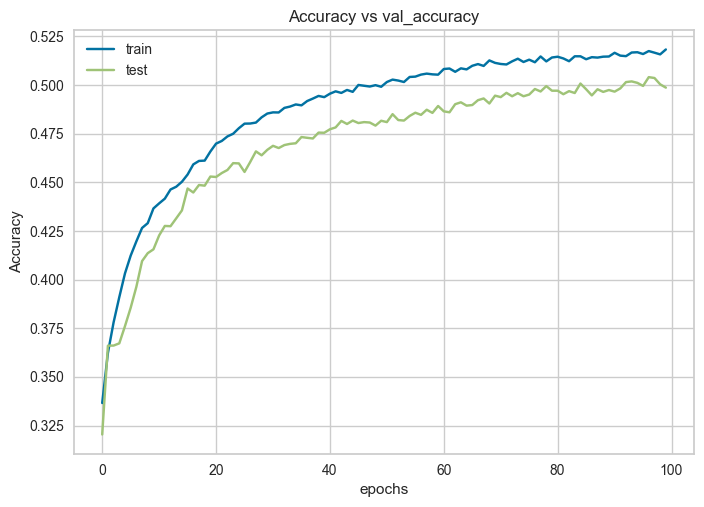

In [228]:
plt.plot(model.history["accuracy"],label="train")
plt.plot(model.history["val_accuracy"],label="test")
plt.title("Accuracy")
plt.xlabel("epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs val_accuracy")
plt.legend()
plt.show()

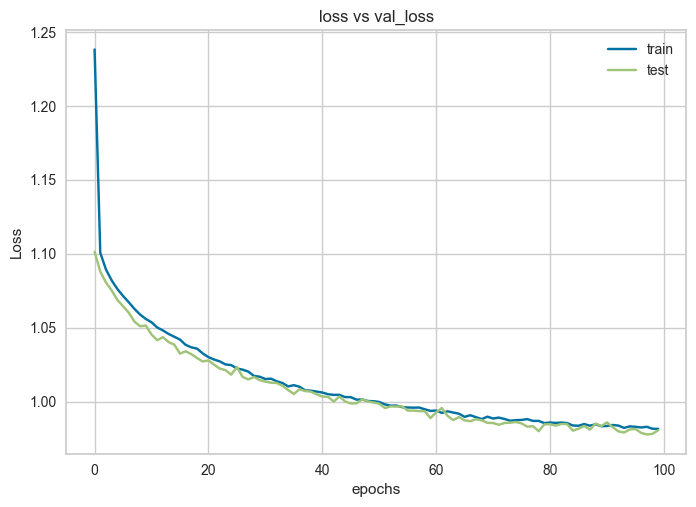

In [229]:
plt.plot(model.history["loss"],label="train")
plt.plot(model.history["val_loss"],label="test")
plt.title("Loss")
plt.xlabel("epochs")
plt.ylabel("Loss")
plt.title("loss vs val_loss")
plt.legend()
plt.show()


In [230]:
y_pred_prob_test = classification.predict(x_test_norm)
y_pred_test_ANN = y_pred_prob_test.argmax(axis=1)

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [231]:
y_pred_prob_train= classification.predict(X_train_resampled)
y_pred_train_ANN = y_pred_prob_train.argmax(axis=1)

3827/3827 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step


In [232]:
print(accuracy_score(y_test,y_pred_test_ANN))

0.4986842105263158


In [233]:
print(accuracy_score(y_train_resampled,y_pred_train_ANN))

0.5446415445680404


In [234]:
print(classification_report(y_test,y_pred_test_ANN))

              precision    recall  f1-score   support

           0       0.67      0.37      0.47     10186
           1       0.46      0.59      0.52      6682
           2       0.43      0.62      0.50      5932

    accuracy                           0.50     22800
   macro avg       0.52      0.53      0.50     22800
weighted avg       0.54      0.50      0.50     22800



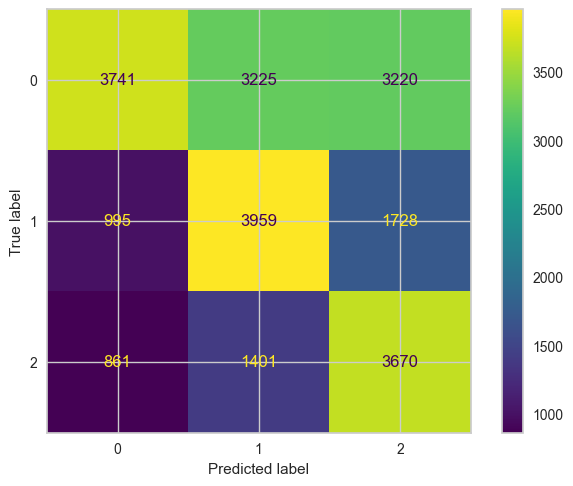

In [235]:
cm=confusion_matrix(y_test,y_pred_test_ANN)
ConfusionMatrixDisplay(cm).plot()
plt.show()

#### Comparison 

In [256]:
from sklearn.metrics import accuracy_score
accuracy_score_logic=accuracy_score(y_test,y_pred_test_logic)
accuracy_score_dtc=accuracy_score(y_test,y_pred_test_dtc)
accuracy_score_forest=accuracy_score(y_test,y_pred_forest_test)
accuracy_score_xgboost=accuracy_score(y_test,y_pred_test_xg)
accuracy_score_ANN=accuracy_score(y_test,y_pred_test_ANN)

comparison=pd.DataFrame({"Logistic Regression":accuracy_score_logic,
                        "DecisionTreeClassifier":accuracy_score_dtc,
                        "RandomForestClassifier":accuracy_score_forest,
                        "XGBClassifier":accuracy_score_xgboost,
                        "ANN":accuracy_score_ANN},index=["accuracy_score"])
comparison_df=comparison.T.sort_values(by="accuracy_score",ascending=False).reset_index()
comparison_df

,index,accuracy_score
0,XGBClassifier,0.577368
1,RandomForestClassifier,0.560395
2,ANN,0.498684
3,DecisionTreeClassifier,0.489518
4,Logistic Regression,0.397763


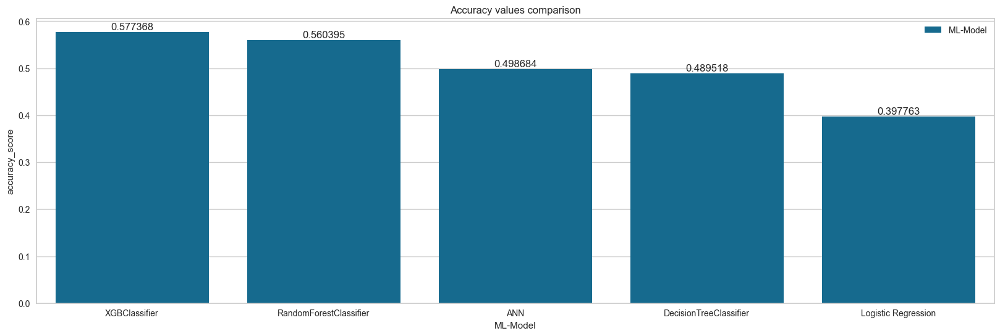

In [258]:
plt.figure(figsize=(20,6))
bar=sns.barplot(x="index",y="accuracy_score",data=comparison_df,label="ML-Model")
for i in bar.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,6)}",ha="center",va="bottom")
plt.title("Accuracy values comparison")
plt.legend()
plt.xlabel("ML-Model")
plt.show()

In [259]:
from sklearn.metrics import precision_score
precision_score_logic=precision_score(y_test,y_pred_test_logic,average="macro")
precision_score_dtc=precision_score(y_test,y_pred_test_dtc,average="macro")
precision_score_forest=precision_score(y_test,y_pred_forest_test,average="macro")
precision_score_xgboost=precision_score(y_test,y_pred_test_xg,average="macro")
precision_score_ANN=precision_score(y_test,y_pred_test_ANN,average="macro")

comparison=pd.DataFrame({"Logistic Regression":precision_score_logic,
                        "DecisionTreeClassifier":precision_score_forest,
                        "RandomForestClassifier":precision_score_forest,
                        "XGBClassifier":precision_score_xgboost,
                        "ANN":precision_score_ANN},index=["precision_score"])
comparison_df=comparison.T.sort_values(by="precision_score",ascending=False).reset_index()
comparison_df

,index,precision_score
0,XGBClassifier,0.567947
1,RandomForestClassifier,0.554380
2,DecisionTreeClassifier,0.554380
3,ANN,0.518467
4,Logistic Regression,0.411133


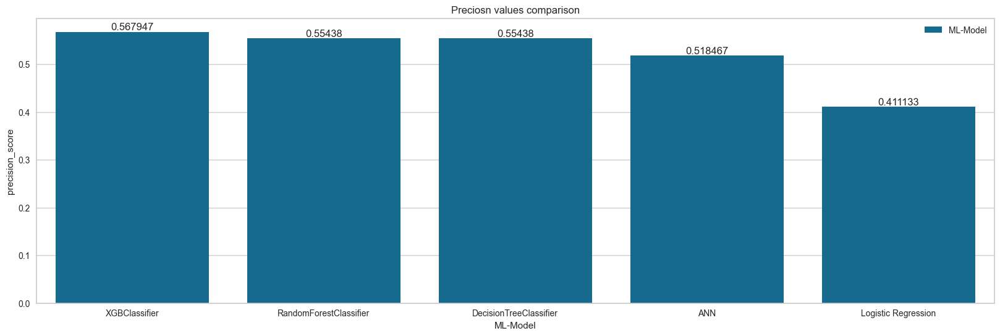

In [260]:
plt.figure(figsize=(20,6))
bar=sns.barplot(x="index",y="precision_score",data=comparison_df,label="ML-Model")
for i in bar.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,6)}",ha="center",va="bottom")
plt.title("Preciosn values comparison")
plt.legend()
plt.xlabel("ML-Model")
plt.show()


In [261]:
from sklearn.metrics import f1_score
f1_score_logic=f1_score(y_test,y_pred_test_logic,average="macro")
f1_score_dtc=f1_score(y_test,y_pred_test_dtc,average="macro")
f1_score_forest=f1_score(y_test,y_pred_forest_test,average="macro")
f1_score_xgboost=f1_score(y_test,y_pred_test_xg,average="macro")
f1_score_ANN=f1_score(y_test,y_pred_test_ANN,average="macro")

comparison=pd.DataFrame({"Logistic Regression":precision_score_logic,
                        "DecisionTreeClassifier":precision_score_forest,
                        "RandomForestClassifier":precision_score_forest,
                        "XGBClassifier":precision_score_xgboost,
                        "ANN":precision_score_ANN},index=["f1_score"])
comparison_df=comparison.T.sort_values(by="f1_score",ascending=False).reset_index()
comparison_df

,index,f1_score
0,XGBClassifier,0.567947
1,RandomForestClassifier,0.554380
2,DecisionTreeClassifier,0.554380
3,ANN,0.518467
4,Logistic Regression,0.411133


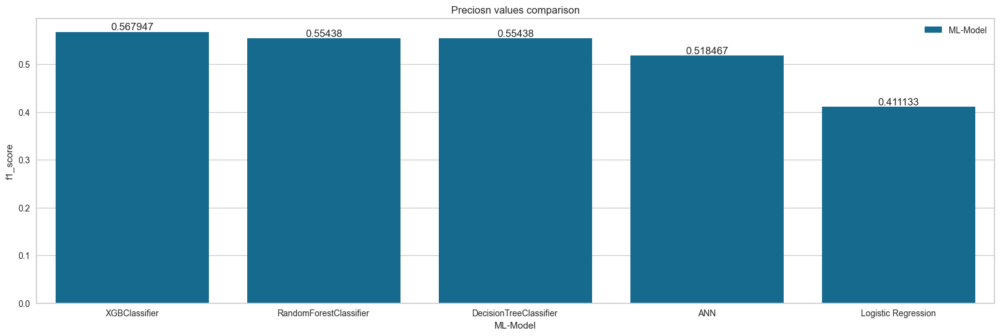

Xgboost is working well as complared to other one


In [262]:
plt.figure(figsize=(20,6))
bar=sns.barplot(x="index",y="f1_score",data=comparison_df,label="ML-Model")
for i in bar.patches:
    height=i.get_height()
    plt.text(i.get_x()+i.get_width()/2,height,f"{round(height,6)}",ha="center",va="bottom")
plt.title("Preciosn values comparison")
plt.legend()
plt.xlabel("ML-Model")
plt.show()
print("Xgboost is working well as complared to other one")

In [263]:
#save the model
import pickle 
with open("xgboost.pkl","wb") as file:
    pickle.dump(xgbc,file)

In [264]:
import pickle
with open("preprocess.pkl","wb") as file:
    pickle.dump(preprocess,file)

In [265]:
#save scalar
import pickle
with open("scalar.pkl","wb") as file:
    pickle.dump(scalar,file)